In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [8]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt
import shap
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load and preprocess the dataset
def load_images(image_dir, img_size=(224, 224)):
    images = []
    labels = []
    
    # Load negative (clear) images
    negative_dir = os.path.join(image_dir, 'Negative', 'Clear')
    for img_name in os.listdir(negative_dir):
        img_path = os.path.join(negative_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(0)  # Label for negative class
    
    # Load positive labelled images
    positive_labelled_dir = os.path.join(image_dir, 'Positive', 'Labelled')
    for img_name in os.listdir(positive_labelled_dir):
        img_path = os.path.join(positive_labelled_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(1)  # Label for positive class (labelled)
    
    # Optionally, you can choose to ignore the unlabelled images or process them differently.
    # Here, we won't use them for training, but you could modify this if needed.
    positive_unlabelled_dir = os.path.join(image_dir, 'Positive', 'Unlabelled')
    for img_name in os.listdir(positive_unlabelled_dir):
        img_path = os.path.join(positive_unlabelled_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(1)  # Label for positive class (unlabelled but still sickle cell)
    
    return np.array(images), np.array(labels)

# Define the explainable AI function (e.g., SHAP)
def explain_with_shap(model, images, num_samples=10):
    explainer = shap.KernelExplainer(model.predict, images[:num_samples])
    shap_values = explainer.shap_values(images[:num_samples])
    shap.summary_plot(shap_values, images[:num_samples])

# Define the ResNet50-based model
def build_model(input_shape=(224, 224, 3)):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    predictions = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Binary classification (Sickle vs. Non-Sickle)
    model = Model(inputs=base_model.input, outputs=predictions)

    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Load and preprocess dataset
image_dir = "/kaggle/input/sickle-cell-disease-dataset"  # Path to the downloaded dataset folder
# Uncomment the line below to download the dataset from Kaggle (if not downloaded already)
# download_kaggle_dataset('dataset-name', image_dir)  # Replace 'dataset-name' with actual dataset name

images, labels = load_images(image_dir)

# Normalize images and one-hot encode labels
images = preprocess_input(images)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Augment the images if needed
datagen = ImageDataGenerator(rotation_range=40, width_shift_range=0.2, height_shift_range=0.2,
                             shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode="nearest")
datagen.fit(X_train)

# Build the model
model = build_model()

# Train the model
model.fit(datagen.flow(X_train, y_train, batch_size=32), epochs=10, validation_data=(X_test, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {accuracy:.4f}")

# Explain with SHAP
explain_with_shap(model, X_test)

# Example for using Grad-CAM (for explainability of the model's decision)
def grad_cam(model, img, last_conv_layer_name="conv5_block3_out"):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img)
        class_idx = np.argmax(preds[0])
        class_channel = preds[:, class_idx]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)  # ReLU activation to focus on positive importance
    heatmap = cv2.resize(heatmap[0], (img.shape[1], img.shape[2]))
    return heatmap

# Visualize Grad-CAM
img_index = 10  # Example test image index
img = np.expand_dims(X_test[img_index], axis=0)
heatmap = grad_cam(model, img)

# Plot the Grad-CAM heatmap
plt.imshow(X_test[img_index])
plt.imshow(heatmap, cmap='jet', alpha=0.5)
plt.show()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/10


Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.


25/25 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - accuracy: 0.6491 - loss: 0.6641 - val_accuracy: 0.8693 - val_loss: 0.3860
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.8564 - loss: 0.3240 - val_accuracy: 0.8894 - val_loss: 0.2729
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.8870 - loss: 0.2427 - val_accuracy: 0.8945 - val_loss: 0.2344
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.8951 - loss: 0.2401 - val_accuracy: 0.9196 - val_loss: 0.2265
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 80s 3s/step - accuracy: 0.9326 - loss: 0.1911 - val_accuracy: 0.9296 - val_loss: 0.2111
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.9261 - loss: 0.1884 - val_accuracy: 0.9296 - val_loss: 0.2069
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.9417 - loss: 0.1559 - val_accuracy: 0.9146 - val_loss: 0.2256
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9385 - loss: 0.1455 - val_accuracy: 0.9296 - val_loss: 0.1934
Epo

DimensionError: Instance must have 1 or 2 dimensions!

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt
import shap
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Parameters (adjustable)
IMG_SIZE = (224, 224)  # Image size for ResNet50
BATCH_SIZE = 32       # Batch size for training
EPOCHS = 10           # Number of epochs
TEST_SIZE = 0.2       # Proportion of data to use for testing

# Load and preprocess the dataset
def load_images(image_dir, img_size=IMG_SIZE):
    images = []
    labels = []
    
    # Load negative (clear) images
    negative_dir = os.path.join(image_dir, 'Negative', 'Clear')
    for img_name in os.listdir(negative_dir):
        img_path = os.path.join(negative_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(0)  # Label for negative class
    
    # Load positive labelled images
    positive_labelled_dir = os.path.join(image_dir, 'Positive', 'Labelled')
    for img_name in os.listdir(positive_labelled_dir):
        img_path = os.path.join(positive_labelled_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(1)  # Label for positive class (labelled)
    
    # Optionally, you can choose to ignore the unlabelled images or process them differently.
    # Here, we won't use them for training, but you could modify this if needed.
    positive_unlabelled_dir = os.path.join(image_dir, 'Positive', 'Unlabelled')
    for img_name in os.listdir(positive_unlabelled_dir):
        img_path = os.path.join(positive_unlabelled_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, img_size)
        img = np.array(img, dtype="float32")
        images.append(img)
        labels.append(1)  # Label for positive class (unlabelled but still sickle cell)
    
    return np.array(images), np.array(labels)


def explain_with_shap(model, images, num_samples=10):
    # Flatten the images from (num_samples, height, width, channels) to (num_samples, height * width * channels)
    images_reshaped = images[:num_samples]
    
    # Create a GradientExplainer, which works with deep learning models in eager execution mode
    explainer = shap.GradientExplainer(model, images_reshaped)
    shap_values = explainer.shap_values(images_reshaped)
    shap.summary_plot(shap_values, images_reshaped)





# Define the ResNet50-based model
def build_model(input_shape=IMG_SIZE + (3,)):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    predictions = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Binary classification (Sickle vs. Non-Sickle)
    model = Model(inputs=base_model.input, outputs=predictions)

    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# # Load and preprocess dataset
# image_dir = "/kaggle/input/sickle-cell-disease-dataset"  # Path to the downloaded dataset folder

# images, labels = load_images(image_dir)

# # Normalize images and preprocess input for ResNet50
# images = preprocess_input(images)

# # Split into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=TEST_SIZE, random_state=42)

# # Augment the images if needed
# datagen = ImageDataGenerator(rotation_range=40, width_shift_range=0.2, height_shift_range=0.2,
#                              shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode="nearest")
# datagen.fit(X_train)

# # Build the model
# model = build_model()

# # Train the model
# model.fit(datagen.flow(X_train, y_train, batch_size=BATCH_SIZE), epochs=EPOCHS, validation_data=(X_test, y_test))

# # Evaluate the model
# loss, accuracy = model.evaluate(X_test, y_test)
# print(f"Test accuracy: {accuracy:.4f}")

# # Explain with SHAP (using DeepExplainer)
# explain_with_shap(model, X_test)

# Grad-CAM visualization for a specific test image
def grad_cam(model, img, last_conv_layer_name="conv5_block3_out"):
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])
    
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img)
        class_idx = np.argmax(preds[0])  # Get the index of the predicted class
        class_channel = preds[:, class_idx]
        
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)  # ReLU activation to focus on positive importance
    heatmap = cv2.resize(heatmap[0], (img.shape[1], img.shape[2]))  # Resize heatmap to image size
    return heatmap

# Visualize Grad-CAM on a sample image from the test set
img_index = 10  # Example test image index
img = np.expand_dims(X_test[img_index], axis=0)  # Expand dims to make it (1, 224, 224, 3)
heatmap = grad_cam(model, img)

# Plot the Grad-CAM heatmap on top of the original image
plt.imshow(X_test[img_index])  # Plot the original image
plt.imshow(heatmap, cmap='jet', alpha=0.5)  # Overlay the heatmap with alpha transparency
plt.show()


NameError: name 'X_test' is not defined

In [23]:
import shap
import numpy as np

# Define a callable wrapper for the model's predict function
def model_predict_fn(images):
    return model.predict(images)

# Define the explainable AI function (e.g., SHAP using KernelExplainer)
def explain_with_shap(model, images, num_samples=10):
    # Ensure the images are properly shaped (batch_size, height, width, channels)
    images_reshaped = images[:num_samples]  # Take a subset of images (e.g., 10 samples)
    
    # Flatten the images (reshape to 2D array: [num_samples, height * width * channels])
    images_flattened = images_reshaped.reshape(images_reshaped.shape[0], -1)
    
    # Create a KernelExplainer, which works well for deep learning models in eager execution mode
    explainer = shap.KernelExplainer(model_predict_fn, images_flattened)

    # Compute SHAP values
    shap_values = explainer.shap_values(images_flattened)
    
    # Check the shape of shap_values to verify
    print("SHAP values shape:", np.array(shap_values).shape)
    
    # Summary plot for the SHAP values
    shap.summary_plot(shap_values, images_flattened)

# Now call the explain_with_shap function
explain_with_shap(model, X_test)


Provided model function fails when applied to the provided data set.


ValueError: as_list() is not defined on an unknown TensorShape.

In [7]:
!ls -R /kaggle/input/sickle-cell-disease-dataset

/kaggle/input/sickle-cell-disease-dataset:
Negative  Positive

/kaggle/input/sickle-cell-disease-dataset/Negative:
Clear

/kaggle/input/sickle-cell-disease-dataset/Negative/Clear:
100.jpg  116.jpg  131.jpg  147.jpg  29.jpg  44.jpg  5.jpg   75.jpg  90.jpg
101.jpg  117.jpg  132.jpg  14.jpg   2.jpg   45.jpg  60.jpg  76.jpg  91.jpg
102.jpg  118.jpg  133.jpg  15.jpg   30.jpg  46.jpg  61.jpg  77.jpg  92.jpg
103.jpg  119.jpg  134.jpg  16.jpg   31.jpg  47.jpg  62.jpg  78.jpg  93.jpg
104.jpg  11.jpg   135.jpg  17.jpg   32.jpg  48.jpg  63.jpg  79.jpg  94.jpg
105.jpg  120.jpg  136.jpg  18.jpg   33.jpg  49.jpg  64.jpg  7.jpg   95.jpg
106.jpg  121.jpg  137.jpg  19.jpg   34.jpg  4.jpg   65.jpg  80.jpg  96.jpg
107.jpg  122.jpg  138.jpg  1.jpg    35.jpg  50.jpg  66.jpg  81.jpg  97.jpg
108.jpg  123.jpg  139.jpg  20.jpg   36.jpg  51.jpg  67.jpg  82.jpg  98.jpg
109.jpg  124.jpg  13.jpg   21.jpg   37.jpg  52.jpg  68.jpg  83.jpg  99.jpg
10.jpg	 125.jpg  140.jpg  22.jpg   38.jpg  53.jpg  69.jpg  84.jpg  9.j

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("florencetushabe/sickle-cell-disease-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/sickle-cell-disease-dataset


📁 Setting up dataset directories...
✅ Normal images: 147
✅ Sickle images: 422
🔄 Preparing data generators...
Found 456 images belonging to 2 classes.
Found 113 images belonging to 2 classes.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ binary_threshold_1 (BinaryThreshold) │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ truth_table_layer_1                  │ (None, 1)                   │             129 │
│ (TruthTableLayer)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

🚀 Starting training...
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:678: UserWarning: Gradients do not exist for variables ['kernel', 'bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


15/15 ━━━━━━━━━━━━━━━━━━━━ 44s 3s/step - accuracy: 0.4190 - loss: 0.7217 - val_accuracy: 0.7434 - val_loss: 0.5799
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.7236 - loss: 0.5991 - val_accuracy: 0.7434 - val_loss: 0.5578
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.7444 - loss: 0.5725 - val_accuracy: 0.7434 - val_loss: 0.5560
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 45s 3s/step - accuracy: 0.7685 - loss: 0.5440 - val_accuracy: 0.7434 - val_loss: 0.5531
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.7534 - loss: 0.5560 - val_accuracy: 0.7434 - val_loss: 0.5501
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.7095 - loss: 0.6035 - val_accuracy: 0.7434 - val_loss: 0.5488
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.7434 - loss: 0.5700 - val_accuracy: 0.7434 - val_loss: 0.5463
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.7228 - loss: 0.5876 - val_accuracy: 0.7434 - val_loss: 0.5431
Epo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


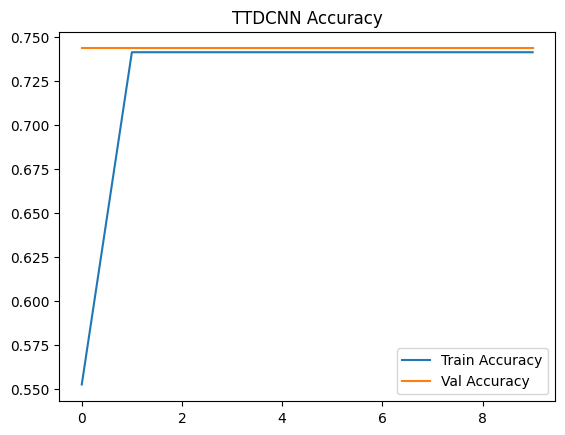

In [2]:
# 📦 STEP 1: Imports
import os
import shutil
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
from pathlib import Path

# 🧼 STEP 2: Clean and organize dataset
print("📁 Setting up dataset directories...")

base_dir = Path("/kaggle/working/sickle_data")
normal_dir = base_dir / "NORMAL"
sickle_dir = base_dir / "SICKLE"

normal_dir.mkdir(parents=True, exist_ok=True)
sickle_dir.mkdir(parents=True, exist_ok=True)

# Copy NORMAL (Negative/Clear)
normal_images = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear").glob("*.jpg")
for img in normal_images:
    shutil.copy(img, normal_dir / img.name)

# Copy SICKLE (Positive/Labelled only!)
sickle_images = Path("/kaggle/input/sickle-cell-disease-dataset/Positive/Labelled").glob("*.jpg")
for img in sickle_images:
    shutil.copy(img, sickle_dir / img.name)

print(f"✅ Normal images: {len(list(normal_dir.glob('*.jpg')))}")
print(f"✅ Sickle images: {len(list(sickle_dir.glob('*.jpg')))}")

# 🧠 STEP 3: Custom Layers for TTDCNN

class BinaryThreshold(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, **kwargs):
        super().__init__(**kwargs)
        self.threshold = threshold

    def call(self, inputs):
        return tf.cast(inputs > self.threshold, tf.float32)

class TruthTableLayer(tf.keras.layers.Layer):
    def __init__(self, output_dim=1, **kwargs):
        super().__init__(**kwargs)
        self.output_dim = output_dim

    def build(self, input_shape):
        input_dim = int(input_shape[-1])
        self.weights_table = self.add_weight(
            shape=(input_dim, self.output_dim),
            initializer='glorot_uniform',
            trainable=True,
            name='ttl_weights'
        )
        self.bias = self.add_weight(
            shape=(self.output_dim,),
            initializer='zeros',
            trainable=True,
            name='ttl_bias'
        )

    def call(self, inputs):
        return tf.matmul(inputs, self.weights_table) + self.bias

# 🧱 STEP 4: Build TTDCNN Model
def build_ttdcnn(input_shape=(224, 224, 3)):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(128),
        layers.Activation('sigmoid'),
        BinaryThreshold(),             # Binarize features
        TruthTableLayer(),             # Logic approximation
        layers.Activation('sigmoid')   # Final binary classification
    ])
    return model

# 🧪 STEP 5: Data Generators
print("🔄 Preparing data generators...")

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

train_gen = datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

val_gen = datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

# 🏋️ STEP 6: Train Model
model = build_ttdcnn()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

print("🚀 Starting training...")
history = model.fit(
    train_gen,
    epochs=10,
    validation_data=val_gen
)

# 📊 STEP 7: Evaluation
print("📈 Evaluating model...")
val_gen.reset()
y_pred = model.predict(val_gen)
y_true = val_gen.classes
y_pred_labels = (y_pred > 0.5).astype(int)

print("🧾 Classification Report:")
print(classification_report(y_true, y_pred_labels))
print("🧮 Confusion Matrix:")
print(confusion_matrix(y_true, y_pred_labels))

# 📉 STEP 8: Plotting
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.legend()
plt.title("TTDCNN Accuracy")
plt.show()


🔎 Found 30 unlabelled images
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


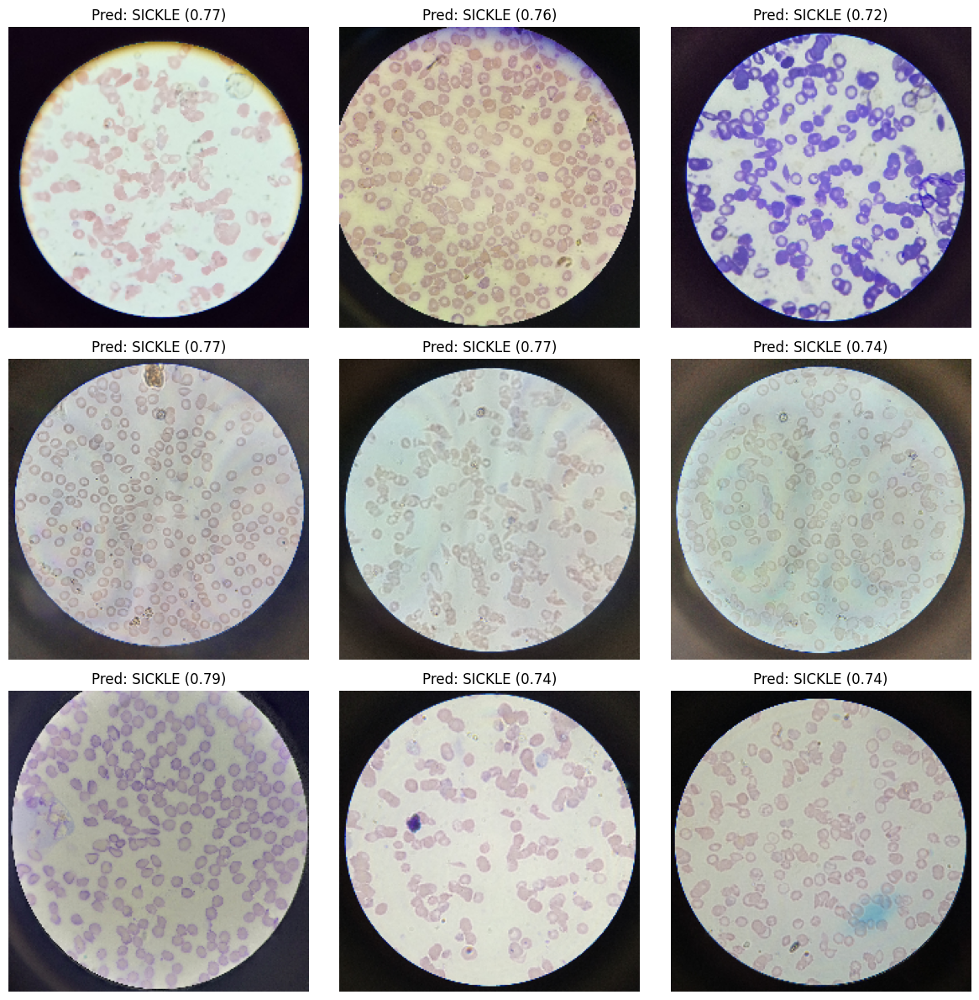

In [3]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# 🔍 STEP 9: Predict on Unlabeled Data
unlabelled_dir = Path("/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled")
unlabelled_imgs = sorted(unlabelled_dir.glob("*.jpg"))[:30]  # Test first 30 for now

print(f"🔎 Found {len(unlabelled_imgs)} unlabelled images")

def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# Predict and plot
plt.figure(figsize=(12, 12))
for i, img_path in enumerate(unlabelled_imgs[:9]):
    img_tensor = preprocess_image(img_path)
    pred = model.predict(img_tensor)[0][0]
    label = "SICKLE" if pred > 0.5 else "NORMAL"
    
    plt.subplot(3, 3, i + 1)
    img_disp = image.load_img(img_path, target_size=(224, 224))
    plt.imshow(img_disp)
    plt.title(f"Pred: {label} ({pred:.2f})")
    plt.axis('off')

plt.tight_layout()
plt.show()


Found 456 images belonging to 2 classes.
Found 113 images belonging to 2 classes.


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10            │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:678: UserWarning: Gradients do not exist for variables ['kernel', 'bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


15/15 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.7255 - loss: 0.6263 - val_accuracy: 0.7434 - val_loss: 0.5619
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.7434 - loss: 0.5687 - val_accuracy: 0.7434 - val_loss: 0.5635
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.7442 - loss: 0.5689 - val_accuracy: 0.7434 - val_loss: 0.5617
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.7235 - loss: 0.5859 - val_accuracy: 0.7434 - val_loss: 0.5604
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.7209 - loss: 0.5833 - val_accuracy: 0.7434 - val_loss: 0.5599
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.7429 - loss: 0.5644 - val_accuracy: 0.7434 - val_loss: 0.5611
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.7659 - loss: 0.5376 - val_accuracy: 0.7434 - val_loss: 0.5595
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.7422 - loss: 0.5621 - val_accuracy: 0.7434 - val_loss: 0.5608
Epo

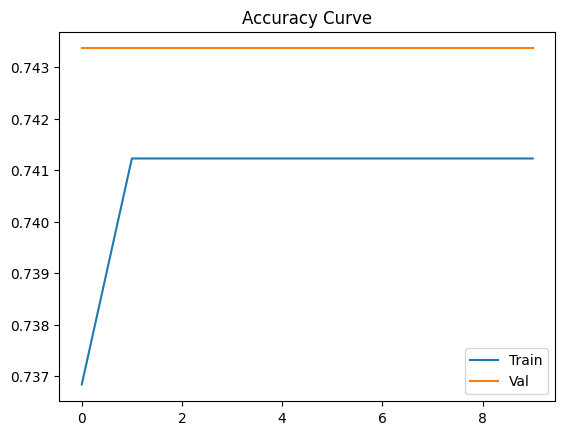

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


ValueError: Attempt to convert a value (None) with an unsupported type (<class 'NoneType'>) to a Tensor.

<Figure size 1400x800 with 0 Axes>

In [12]:
# 📦 Imports
import os, shutil, numpy as np, cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img, img_to_array
from sklearn.metrics import classification_report, confusion_matrix

# 📁 Dataset organization
base_dir = Path("/kaggle/working/sickle_data")
normal_dir = base_dir / "NORMAL"
sickle_dir = base_dir / "SICKLE"
normal_dir.mkdir(parents=True, exist_ok=True)
sickle_dir.mkdir(parents=True, exist_ok=True)

for img in Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear").glob("*.jpg"):
    shutil.copy(img, normal_dir / img.name)

for img in Path("/kaggle/input/sickle-cell-disease-dataset/Positive/Labelled").glob("*.jpg"):
    shutil.copy(img, sickle_dir / img.name)

# 🧠 Custom TTL layers
class BinaryThreshold(tf.keras.layers.Layer):
    def call(self, inputs): return tf.cast(inputs > 0.5, tf.float32)

class TruthTableLayer(tf.keras.layers.Layer):
    def build(self, input_shape):
        self.w = self.add_weight(name="ttl_weights", shape=(input_shape[-1], 1),
                                 initializer="glorot_uniform", trainable=True)
        self.b = self.add_weight(name="ttl_bias", shape=(1,), initializer="zeros", trainable=True)
    def call(self, x): return tf.matmul(x, self.w) + self.b

# 🏗️ TTDCNN + ResNet backbone (return both)
def build_ttdcnn(input_shape=(224, 224, 3)):
    inputs = tf.keras.Input(shape=input_shape)
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)
    base_model.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128)(x)
    sigmoid_out = layers.Activation('sigmoid', name="pre_ttl_sigmoid")(x)
    binary_out = BinaryThreshold(name="binary_threshold")(sigmoid_out)
    ttl_out = TruthTableLayer(name="truth_table_layer")(binary_out)
    output = layers.Activation('sigmoid', name="final_output")(ttl_out)

    full_model = models.Model(inputs=inputs, outputs=output)
    return full_model, base_model

# ⚙️ Load data
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_gen = datagen.flow_from_directory(base_dir, target_size=(224, 224), batch_size=32,
                                        class_mode='binary', subset='training')
val_gen = datagen.flow_from_directory(base_dir, target_size=(224, 224), batch_size=32,
                                      class_mode='binary', subset='validation')

# 🚀 Build + train model
model, base_model = build_ttdcnn()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()
history = model.fit(train_gen, epochs=10, validation_data=val_gen)

# 📊 Evaluation
val_gen.reset()
y_pred = model.predict(val_gen)
y_true = val_gen.classes
y_pred_bin = (y_pred > 0.5).astype(int)
print(confusion_matrix(y_true, y_pred_bin))
print(classification_report(y_true, y_pred_bin, zero_division=0))

# 📈 Accuracy curve
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title("Accuracy Curve")
plt.legend(); plt.show()

# 🧪 Unlabelled images
unlabelled_imgs = sorted(Path("/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled").glob("*.jpg"))[:5]

def preprocess_image(img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

_ = model.predict(preprocess_image(unlabelled_imgs[0]))  # Warmup

# ✅ Robust Grad-CAM
def make_gradcam_heatmap(img_array, base_model, classifier_model):
    conv_layer = base_model.get_layer("conv5_block3_out")
    grad_model = models.Model(inputs=base_model.input, outputs=[conv_layer.output, base_model.output])

    with tf.GradientTape() as tape:
        conv_out, features = grad_model(img_array)
        tape.watch(conv_out)

        x = tf.keras.layers.GlobalAveragePooling2D()(features)
        x = tf.keras.layers.Dense(128)(x)
        x = tf.keras.activations.sigmoid(x)
        x = tf.cast(x > 0.5, tf.float32)
        w, b = classifier_model.get_layer("truth_table_layer").get_weights()
        x = tf.matmul(x, w) + b
        prediction = tf.keras.activations.sigmoid(x)
        class_output = prediction[:, 0]

    grads = tape.gradient(class_output, conv_out)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out = conv_out[0]
    heatmap = conv_out @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    return tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)

# 🧠 TTL feature extractor
extractor = models.Model(
    inputs=model.input,
    outputs=[
        model.get_layer("pre_ttl_sigmoid").output,
        model.get_layer("binary_threshold").output
    ]
)
ttl_weights = model.get_layer("truth_table_layer").get_weights()[0].squeeze()

# 🎯 Grad-CAM + TTL logic visualization
plt.figure(figsize=(14, 8))
for i, img_path in enumerate(unlabelled_imgs):
    img_tensor = preprocess_image(img_path)
    heatmap = make_gradcam_heatmap(img_tensor, base_model, model).numpy()

    sigmoid_out, binary_vec = extractor.predict(img_tensor)
    binary_str = "".join([str(int(b)) for b in binary_vec[0]])

    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (224, 224))
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

    plt.subplot(2, 3, i + 1)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title(f"TTL Input: {binary_str}")
    plt.axis('off')

plt.tight_layout()
plt.suptitle("🧠 Grad-CAM + TTL Input Visualization", fontsize=16)
plt.show()

# 📜 TTL Logic Weights
print("🧮 TTL Rule Approximation:")
for i, w in enumerate(ttl_weights):
    if abs(w) > 0.1:
        print(f"If x{i} = 1 → contributes {w:.2f} to SICKLE")


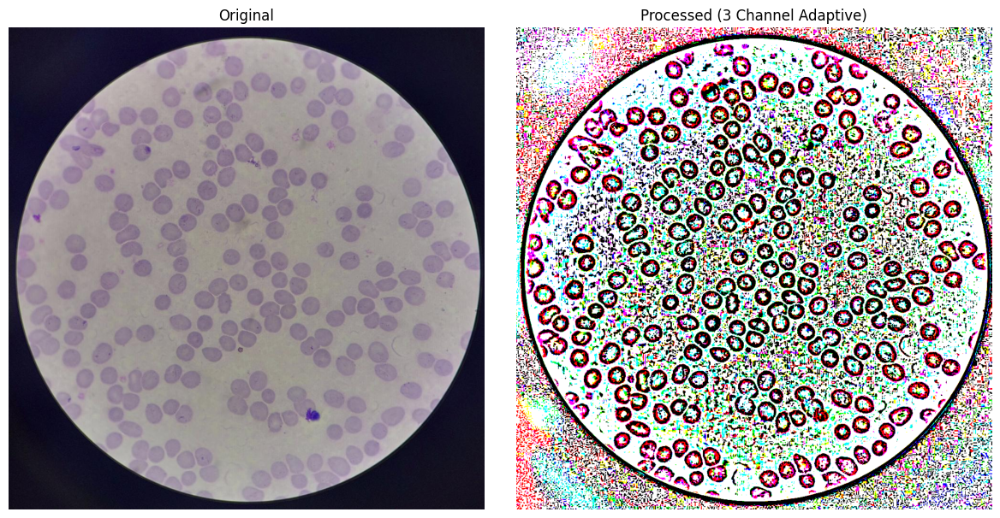

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# 🔁 Load sample image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 📦 Process a single channel (equalize + adaptive threshold)
def process_channel(channel_img):
    eq = cv2.equalizeHist(channel_img)
    adaptive = cv2.adaptiveThreshold(eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY, blockSize=35, C=5)
    return adaptive

# 🔄 Split channels and process independently
r, g, b = cv2.split(img_rgb)
r_proc = process_channel(r)
g_proc = process_channel(g)
b_proc = process_channel(b)

# 🔀 Stack processed channels into final image
processed_img = cv2.merge([r_proc, g_proc, b_proc])
processed_img_rgb = cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB)  # Optional: for display

# 🔍 Show original vs processed
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(processed_img_rgb)
plt.title("Processed (3 Channel Adaptive)")
plt.axis('off')
plt.tight_layout()
plt.show()


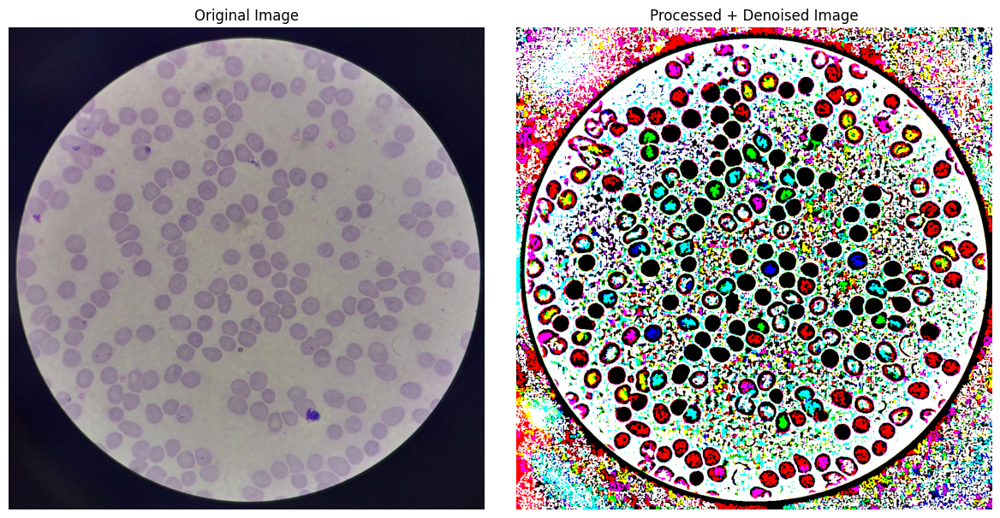

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load the image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Clean up function per channel
def clean_channel(channel_img, min_area=300):
    # 1. Histogram equalization
    eq = cv2.equalizeHist(channel_img)

    # 2. Adaptive thresholding
    thresh = cv2.adaptiveThreshold(eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, blockSize=35, C=5)

    # 3. Morphological opening (to remove edge noise)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    # 4. Remove small connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(opened, connectivity=8)
    cleaned = np.zeros_like(opened)
    for i in range(1, num_labels):  # skip background
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            cleaned[labels == i] = 255

    return cleaned

# Process all 3 channels independently
r, g, b = cv2.split(img_rgb)
r_clean = clean_channel(r)
g_clean = clean_channel(g)
b_clean = clean_channel(b)

# Merge into 3-channel cleaned image
cleaned_image = cv2.merge([r_clean, g_clean, b_clean])
cleaned_image_rgb = cv2.cvtColor(cleaned_image, cv2.COLOR_BGR2RGB)  # for preview

# Show before and after
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cleaned_image_rgb)
plt.title("Processed + Denoised Image")
plt.axis('off')

plt.tight_layout()
plt.show()


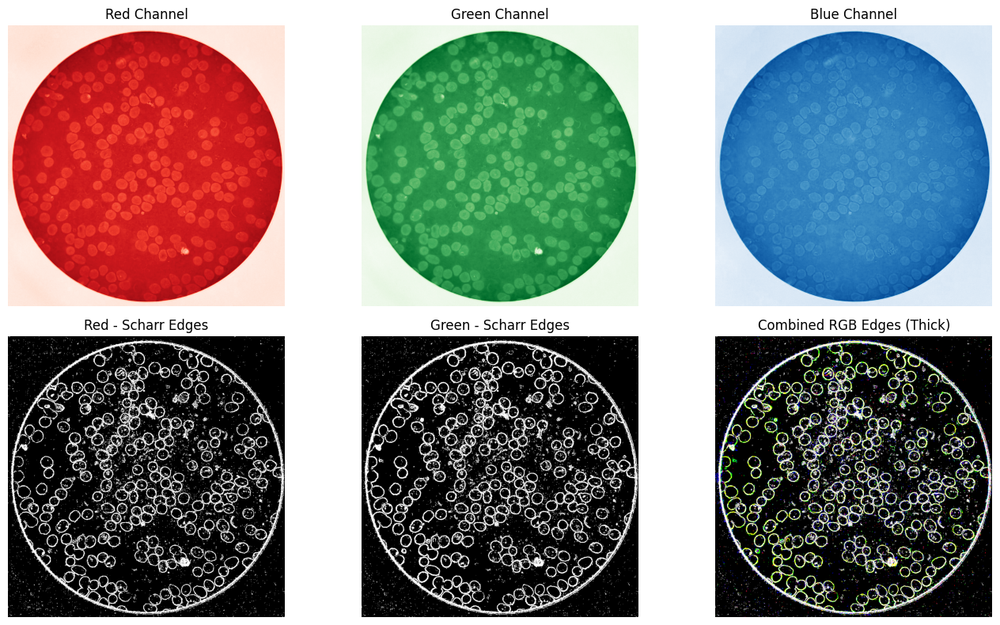

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load and convert to RGB
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get individual channels
r, g, b = cv2.split(img_rgb)

# Scharr edge detector
def scharr_edges(channel):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)

    # Optional: threshold to keep only thicker edges
    _, thick_edges = cv2.threshold(mag, 100, 255, cv2.THRESH_BINARY)  # adjust 100 as needed
    return thick_edges

# Apply Scharr to each channel
r_edges = scharr_edges(r)
g_edges = scharr_edges(g)
b_edges = scharr_edges(b)

# Stack for RGB edge visualization
edge_rgb = cv2.merge([r_edges, g_edges, b_edges])

# Show all
plt.figure(figsize=(14, 8))

plt.subplot(2, 3, 1)
plt.imshow(r, cmap='Reds')
plt.title("Red Channel"); plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(g, cmap='Greens')
plt.title("Green Channel"); plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(b, cmap='Blues')
plt.title("Blue Channel"); plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(r_edges, cmap='gray')
plt.title("Red - Scharr Edges"); plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(g_edges, cmap='gray')
plt.title("Green - Scharr Edges"); plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(edge_rgb)
plt.title("Combined RGB Edges (Thick)"); plt.axis('off')

plt.tight_layout()
plt.show()


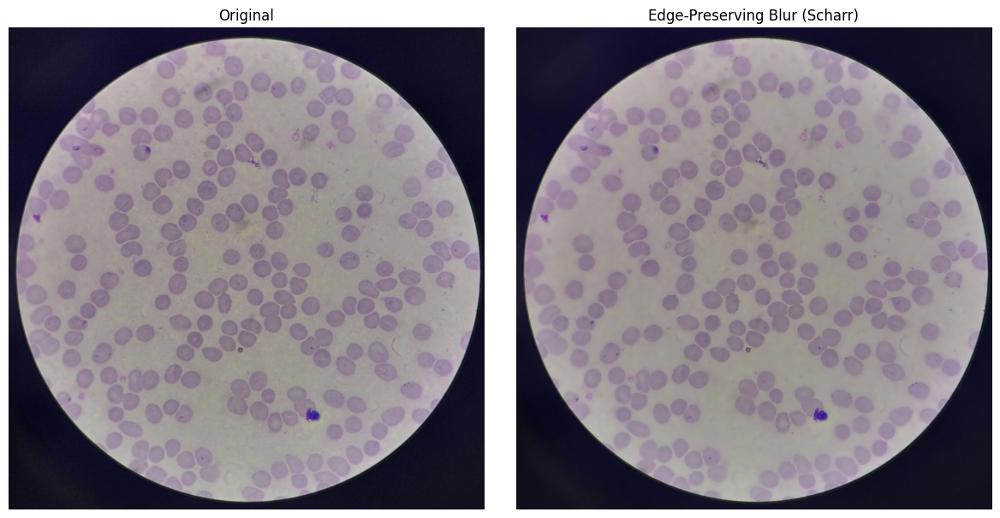

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load and prepare image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Split channels
r, g, b = cv2.split(img_rgb)

# Scharr + binary edge mask
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

# Detect thick edges per channel
r_mask = thick_scharr_mask(r)
g_mask = thick_scharr_mask(g)
b_mask = thick_scharr_mask(b)

# Merge to full RGB edge mask (logical OR)
combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)
combined_mask_inv = cv2.bitwise_not(combined_mask)

# Blur original image
blurred = cv2.GaussianBlur(img_rgb, (15, 15), 0)

# Masking: keep edges sharp
sharp_regions = cv2.bitwise_and(img_rgb, img_rgb, mask=combined_mask)
blurred_regions = cv2.bitwise_and(blurred, blurred, mask=combined_mask_inv)

# Combine sharp + blurred
final_output = cv2.add(sharp_regions, blurred_regions)

# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(final_output)
plt.title("Edge-Preserving Blur (Scharr)")
plt.axis('off')
plt.tight_layout()
plt.show()


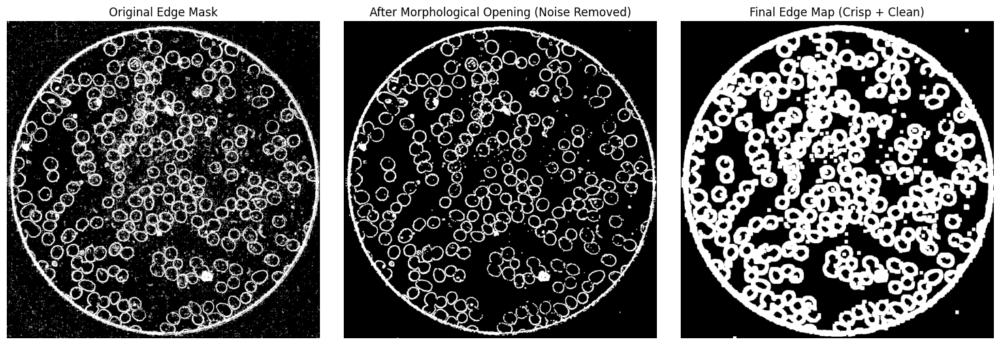

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Split channels
r, g, b = cv2.split(img_rgb)

# Scharr + binary edge mask
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

# Get edge masks for each channel
r_mask = thick_scharr_mask(r)
g_mask = thick_scharr_mask(g)
b_mask = thick_scharr_mask(b)

# Combine edge masks
combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

# --- Clean the edge mask ---
# 1. Remove small white specks (noise) with morphological opening
kernel = np.ones((3, 3), np.uint8)
opened_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

# 2. Optionally, enhance the clean edges with dilation (optional)
clean_edge_mask = cv2.dilate(opened_mask, kernel, iterations=4)

# Display
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(combined_mask, cmap='gray')
plt.title("Original Edge Mask")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(opened_mask, cmap='gray')
plt.title("After Morphological Opening (Noise Removed)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clean_edge_mask, cmap='gray')
plt.title("Final Edge Map (Crisp + Clean)")
plt.axis('off')

plt.tight_layout()
plt.show()


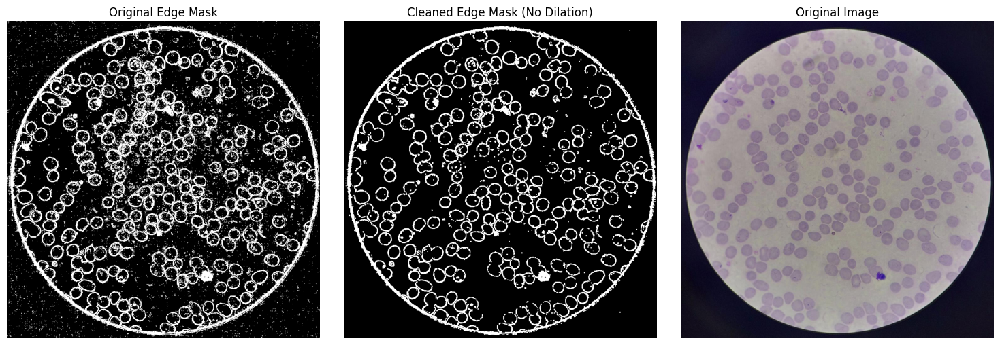

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Split channels
r, g, b = cv2.split(img_rgb)

# Scharr + binary edge mask
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

# Get edge masks for each channel
r_mask = thick_scharr_mask(r)
g_mask = thick_scharr_mask(g)
b_mask = thick_scharr_mask(b)

# Combine edge masks
combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

# --- Clean the edge mask ---
# Morphological opening to remove noise
kernel = np.ones((3, 3), np.uint8)
clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

# Display
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(combined_mask, cmap='gray')
plt.title("Original Edge Mask")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(clean_edge_mask, cmap='gray')
plt.title("Cleaned Edge Mask (No Dilation)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.tight_layout()
plt.show()


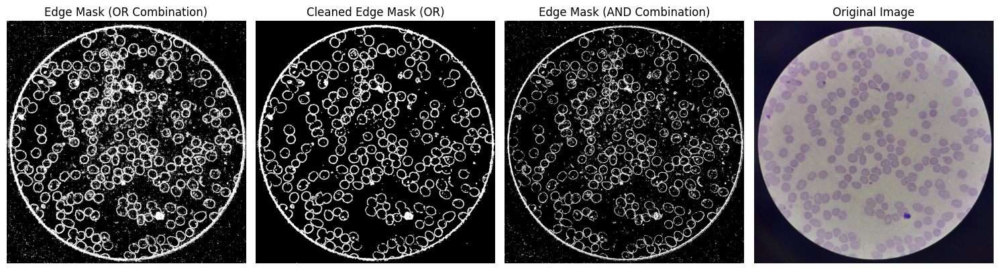

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load image
img_path = Path("/kaggle/input/sickle-cell-disease-dataset/Negative/Clear/1.jpg")
img = cv2.imread(str(img_path))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Split channels
r, g, b = cv2.split(img_rgb)

# Scharr + binary edge mask
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

# Get edge masks for each channel
r_mask = thick_scharr_mask(r)
g_mask = thick_scharr_mask(g)
b_mask = thick_scharr_mask(b)

# Combine edge masks using bitwise OR
combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

# Combine edge masks using bitwise AND
combined_mask_and = cv2.bitwise_and(cv2.bitwise_and(r_mask, g_mask), b_mask)

# --- Clean the edge masks ---
# Morphological opening to remove noise
kernel = np.ones((3, 3), np.uint8)
clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)
clean_edge_mask_and = cv2.morphologyEx(combined_mask_and, cv2.MORPH_OPEN, kernel, iterations=1)

# Display the results
plt.figure(figsize=(15, 5))

# Display original edge mask (OR combination)
plt.subplot(1, 4, 1)
plt.imshow(combined_mask_or, cmap='gray')
plt.title("Edge Mask (OR Combination)")
plt.axis('off')

# Display cleaned edge mask (OR combination)
plt.subplot(1, 4, 2)
plt.imshow(clean_edge_mask_or, cmap='gray')
plt.title("Cleaned Edge Mask (OR)")
plt.axis('off')

# Display original edge mask (AND combination)
plt.subplot(1, 4, 3)
plt.imshow(combined_mask_and, cmap='gray')
plt.title("Edge Mask (AND Combination)")
plt.axis('off')

# Display the original image
plt.subplot(1, 4, 4)
plt.imshow(img_rgb)
plt.title("Original Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Now to model training


Loading positive samples: 100%|██████████| 422/422 [00:14<00:00, 29.06it/s]


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 11s 599ms/step - accuracy: 0.6406 - loss: 0.6170 - val_accuracy: 0.7105 - val_loss: 0.6050
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 567ms/step - accuracy: 0.7728 - loss: 0.5548 - val_accuracy: 0.7105 - val_loss: 0.5847
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 566ms/step - accuracy: 0.7346 - loss: 0.5354 - val_accuracy: 0.7105 - val_loss: 0.6171
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 622ms/step - accuracy: 0.7548 - loss: 0.5117 - val_accuracy: 0.7105 - val_loss: 0.5796
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 565ms/step - accuracy: 0.7718 - loss: 0.4793 - val_accuracy: 0.7105 - val_loss: 0.5772
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 561ms/step - accuracy: 0.7721 - loss: 0.4842 - val_accuracy: 0.7105 - val_loss: 0.5736
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 590ms/step - accuracy: 0.7495 - loss: 0.4944 - val_accuracy: 0.7105 - val_loss: 0.5947
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 565ms/step - accuracy: 0.7355 - loss: 0.4731 - val_accuracy:

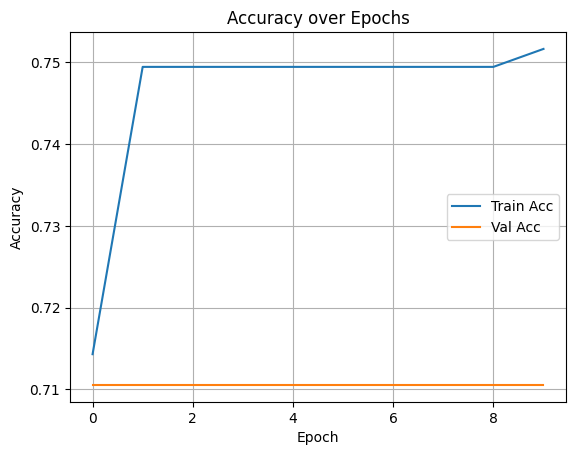

In [31]:
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# === Parameters ===
IMG_SIZE = (128, 128)
DATASET_DIR = Path("/kaggle/input/sickle-cell-disease-dataset")
CLEAR_DIR = DATASET_DIR / "Negative" / "Clear"
UNLABELLED_DIR = DATASET_DIR / "Positive" / "Unlabelled"

# === Scharr Edge Detection Function ===
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

def preprocess_image(img_path):
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, IMG_SIZE)
    
    # Edge detection
    r, g, b = cv2.split(img_resized)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)
    combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Normalize
    img_norm = img_resized / 255.0
    edge_norm = clean_edge_mask / 255.0
    edge_norm = np.expand_dims(edge_norm, axis=-1)

    final_input = np.concatenate([img_norm, edge_norm], axis=-1)
    return final_input

# === Load Data ===
def load_dataset(negative_dir, positive_dir):
    X, y = [], []

    for img_file in tqdm(list(negative_dir.glob("*.jpg")), desc="Loading negative samples"):
        try:
            X.append(preprocess_image(img_file))
            y.append(0)
        except:
            continue

    for img_file in tqdm(list(positive_dir.glob("*.jpg")), desc="Loading positive samples"):
        try:
            X.append(preprocess_image(img_file))
            y.append(1)
        except:
            continue

    return np.array(X), np.array(y)

# === Load and Split Data ===
X, y = load_dataset(CLEAR_DIR, UNLABELLED_DIR)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# === Define Model ===
model = models.Sequential([
    layers.Input(shape=(128, 128, 4)),
    layers.Conv2D(32, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, activation='relu', padding='same'),
    layers.GlobalAveragePooling2D(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# === Train Model ===
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)

# === Plot Accuracy ===
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.legend()
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(True)
plt.show()


In [34]:
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import xml.etree.ElementTree as ET

# === Parameters ===
IMG_SIZE = (128, 128)
DATASET_DIR = Path("/kaggle/input/sickle-cell-disease-dataset")
CLEAR_DIR = DATASET_DIR / "Negative" / "Clear"
UNLABELLED_DIR = DATASET_DIR / "Positive" / "Unlabelled"
LABELLED_DIR = DATASET_DIR / "Positive" / "Labelled"

# === Scharr Edge Detection Function ===
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

def preprocess_image(img_path, is_labelled=False):
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, IMG_SIZE)
    
    # Edge detection
    r, g, b = cv2.split(img_resized)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)
    combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Normalize
    img_norm = img_resized / 255.0
    edge_norm = clean_edge_mask / 255.0
    edge_norm = np.expand_dims(edge_norm, axis=-1)

    final_input = np.concatenate([img_norm, edge_norm], axis=-1)

    if is_labelled:
        # Parse XML for bounding boxes
        xml_path = img_path.with_suffix('.xml')
        tree = ET.parse(str(xml_path))
        root = tree.getroot()
        bboxes = []
        for obj in root.findall('object'):
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            bboxes.append([xmin, ymin, xmax, ymax])
        return final_input, bboxes
    else:
        return final_input, []

# === Load Data ===
# === Load Data ===
def load_dataset(negative_dir, positive_dir, labelled_dir):
    X, y_class, y_bboxes = [], [], []

    # Negative class
    for img_file in tqdm(list(negative_dir.glob("*.jpg")), desc="Loading negative samples"):
        try:
            img_input, bboxes = preprocess_image(img_file)
            X.append(img_input)
            y_class.append(0)
            y_bboxes.append([])
        except:
            continue

    # Positive class
    for img_file in tqdm(list(positive_dir.glob("*.jpg")), desc="Loading positive samples"):
        try:
            img_input, bboxes = preprocess_image(img_file)
            X.append(img_input)
            y_class.append(1)
            y_bboxes.append([])
        except:
            continue

    # Labelled positive class
    for img_file in tqdm(list(labelled_dir.glob("*.jpg")), desc="Loading labelled positive samples"):
        try:
            img_input, bboxes = preprocess_image(img_file, is_labelled=True)
            X.append(img_input)
            y_class.append(1)
            y_bboxes.append(bboxes)
        except:
            continue

    # Ensure all data aligns, i.e., X and y_bboxes have the same number of samples
    return np.array(X), np.array(y_class), y_bboxes

# === Ensure Matching Sample Counts ===
X, y_class, y_bboxes = load_dataset(CLEAR_DIR, UNLABELLED_DIR, LABELLED_DIR)

# Split dataset into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y_class, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Ensure y_bboxes are aligned with the train, validation, and test splits
y_bboxes_train = [y_bboxes[i] for i in range(len(X_train))]
y_bboxes_val = [y_bboxes[i] for i in range(len(X_val))]
y_bboxes_test = [y_bboxes[i] for i in range(len(X_test))]

# Rescale bounding boxes for localization model
def resize_bboxes(bboxes, img_shape):
    resized_bboxes = []
    for bbox in bboxes:
        xmin, ymin, xmax, ymax = bbox
        xmin_resized = int(xmin * (IMG_SIZE[0] / img_shape[1]))
        ymin_resized = int(ymin * (IMG_SIZE[1] / img_shape[0]))
        xmax_resized = int(xmax * (IMG_SIZE[0] / img_shape[1]))
        ymax_resized = int(ymax * (IMG_SIZE[1] / img_shape[0]))
        resized_bboxes.append([xmin_resized, ymin_resized, xmax_resized, ymax_resized])
    return np.array(resized_bboxes)

y_bboxes_train_resized = [resize_bboxes(bboxes, img.shape) for bboxes in y_bboxes_train]
y_bboxes_val_resized = [resize_bboxes(bboxes, img.shape) for bboxes in y_bboxes_val]
y_bboxes_test_resized = [resize_bboxes(bboxes, img.shape) for bboxes in y_bboxes_test]

# === Define and Train Models ===
# Train the Classification Model
classification_model.fit(X_train, y_train, epochs=10, batch_size=16, validation_data=(X_val, y_val))

# Train the Localization Model
localization_model.fit(X_train, np.array(y_bboxes_train_resized), epochs=10, batch_size=16, validation_data=(X_val, np.array(y_bboxes_val_resized)))

# === Evaluate Models ===
classification_loss, classification_acc = classification_model.evaluate(X_test, y_test)
print(f"Classification Test Accuracy: {classification_acc * 100:.2f}%")

# Evaluate Localization Model
localization_loss = localization_model.evaluate(X_test, np.array(y_bboxes_test_resized))
print(f"Localization Test Loss: {localization_loss:.4f}")


# === Visualization of Predictions ===
# Visualize some test images and predicted bounding boxes
for i in range(5):
    img_input = X_test[i]
    bbox_true = y_bboxes_test[i]

    # Classification Prediction
    class_pred = classification_model.predict(np.expand_dims(img_input, axis=0))[0][0]

    # Localization Prediction
    bbox_pred = localization_model.predict(np.expand_dims(img_input, axis=0))[0]

    # Plot results
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img_input[:, :, :3])  # Only RGB channels for display
    plt.title(f"True Class: {y_test[i]}, Predicted Class: {int(class_pred > 0.5)}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_input[:, :, :3])  # Only RGB channels for display
    for bbox in bbox_true:
        xmin, ymin, xmax, ymax = bbox
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='red', linewidth=2))
    plt.title("True Bboxes")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_input[:, :, :3])  # Only RGB channels for display
    for bbox in bbox_pred:
        xmin, ymin, xmax, ymax = bbox
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='blue', linewidth=2))
    plt.title("Predicted Bboxes")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


Loading labelled positive samples: 100%|██████████| 422/422 [00:06<00:00, 66.27it/s]


Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 285ms/step - accuracy: 0.8364 - loss: 0.3963 - val_accuracy: 0.7368 - val_loss: 0.6961
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 296ms/step - accuracy: 0.8337 - loss: 0.4026 - val_accuracy: 0.7544 - val_loss: 0.6132
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - accuracy: 0.8632 - loss: 0.3537 - val_accuracy: 0.7018 - val_loss: 0.8109
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 273ms/step - accuracy: 0.8153 - loss: 0.4320 - val_accuracy: 0.7895 - val_loss: 0.5996
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 273ms/step - accuracy: 0.8088 - loss: 0.4005 - val_accuracy: 0.8070 - val_loss: 0.6009
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 275ms/step - accuracy: 0.8233 - loss: 0.4511 - val_accuracy: 0.7368 - val_loss: 0.6283
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 277ms/step - accuracy: 0.8257 - loss: 0.3921 - val_accuracy: 0.8070 - val_loss: 0.6122
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 273ms/step - accuracy: 0.8267 - loss: 0.3710 - val_accuracy: 

ValueError: Dimensions must be equal, but are 0 and 4 for '{{node compile_loss/mean_squared_error/sub}} = Sub[T=DT_FLOAT](data_1, sequential_3_1/conv2d_12_1/Sigmoid)' with input shapes: [?,0], [?,64,64,4].

In [4]:
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import tensorflow as tf

# === Parameters ===
IMG_SIZE = (128, 128)
DATASET_DIR = Path("/kaggle/input/sickle-cell-disease-dataset")
CLEAR_DIR = DATASET_DIR / "Negative" / "Clear"
UNLABELLED_DIR = DATASET_DIR / "Positive" / "Unlabelled"

# === Scharr Edge Detection Function ===
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

def preprocess_image(img_path):
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, IMG_SIZE)
    
    # Edge detection
    r, g, b = cv2.split(img_resized)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)
    combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Normalize
    img_norm = img_resized / 255.0
    edge_norm = clean_edge_mask / 255.0
    edge_norm = np.expand_dims(edge_norm, axis=-1)

    final_input = np.concatenate([img_norm, edge_norm], axis=-1)
    return final_input

# === Load Data ===
def load_dataset(negative_dir, positive_dir):
    X, y = [], []

    for img_file in tqdm(list(negative_dir.glob("*.jpg")), desc="Loading negative samples"):
        try:
            X.append(preprocess_image(img_file))
            y.append(0)
        except:
            continue

    for img_file in tqdm(list(positive_dir.glob("*.jpg")), desc="Loading positive samples"):
        try:
            X.append(preprocess_image(img_file))
            y.append(1)
        except:
            continue

    return np.array(X), np.array(y)

# === Load and Split Data ===
X, y = load_dataset(CLEAR_DIR, UNLABELLED_DIR)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# === Define Classification Model ===
classification_model = models.Sequential([
    layers.Input(shape=(128, 128, 4)),  # 4 channels: RGB + edge mask
    layers.Conv2D(32, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, activation='relu', padding='same'),
    layers.GlobalAveragePooling2D(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # Binary classification output
])

classification_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# === Train the Classification Model ===
history = classification_model.fit(X_train, y_train, validation_data=(X_val, y_val),
                                   epochs=1, batch_size=32)

# === Heatmap Generation ===
def generate_heatmap(model, image):
    # 1. Explicitly define inputs and outputs
    inputs = tf.keras.Input(shape=(128, 128, 4))  # Input shape based on the model's input
    outputs = model(inputs)  # Forward pass to get the output

    # 2. Ensure model is built by passing a dummy input (image) through it
    image = tf.convert_to_tensor(image)  # Convert to tensor in case it's not already
    model(image)  # This initializes the layers, i.e., runs the model on the image
    
    # 3. Find the first Conv2D layer in the model dynamically
    conv_layers = [layer for layer in model.layers if isinstance(layer, tf.keras.layers.Conv2D)]
    if len(conv_layers) == 0:
        raise ValueError("No Conv2D layer found in the model.")
    
    # Use the first Conv2D layer
    layer_name = conv_layers[0].name
    
    # 4. Create a grad_model that outputs both the selected layer's output and final predictions
    grad_model = tf.keras.models.Model(inputs=[model.inputs], outputs=[model.get_layer(layer_name).output, model.output])
    
    # 5. Record the gradients of the prediction
    with tf.GradientTape() as tape:
        tape.watch(image)
        conv_output, preds = grad_model(image)
    
    # 6. Identify the class index for which we want the heatmap (most likely predicted class)
    class_idx = np.argmax(preds[0])  # Using the index of the highest predicted class
    grads = tape.gradient(preds[:, class_idx], conv_output)
    
    # 7. Pool the gradients and compute the heatmap
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pooling over the feature map dimensions
    
    # 8. Multiply conv_output by the pooled gradients to get the heatmap
    conv_output = conv_output[0]  # Remove batch dimension
    heatmap = tf.reduce_sum(tf.multiply(conv_output, pooled_grads), axis=-1)
    
    # 9. Normalize the heatmap
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    return heatmap

# Visualize heatmap
image = X_val[0]  # Use the first validation image
image = np.expand_dims(image, axis=0)  # Add batch dimension (required for models)

heatmap = generate_heatmap(classification_model, image)  # Generate heatmap for the first validation image

# Plot the heatmap
plt.imshow(heatmap, cmap='jet')
plt.colorbar()
plt.title("Heatmap")
plt.show()


Loading positive samples: 100%|██████████| 422/422 [00:10<00:00, 40.09it/s]


15/15 ━━━━━━━━━━━━━━━━━━━━ 12s 688ms/step - accuracy: 0.7535 - loss: 0.6031 - val_accuracy: 0.7105 - val_loss: 0.6002


KeyError: 'Exception encountered when calling Functional.call().\n\n\x1b[1m138640589677680\x1b[0m\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 128, 128, 4), dtype=float64)\n  • training=None\n  • mask=None'

Loading positive samples: 100%|██████████| 422/422 [00:10<00:00, 39.42it/s]


Epoch 1/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 11s 625ms/step - accuracy: 0.7289 - loss: 0.5840 - val_accuracy: 0.7105 - val_loss: 0.5951
Epoch 2/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 641ms/step - accuracy: 0.7543 - loss: 0.5413 - val_accuracy: 0.7105 - val_loss: 0.5892
Epoch 3/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 645ms/step - accuracy: 0.7592 - loss: 0.5286 - val_accuracy: 0.7105 - val_loss: 0.5791
Epoch 4/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 9s 597ms/step - accuracy: 0.7616 - loss: 0.4912 - val_accuracy: 0.7105 - val_loss: 0.5976
Epoch 5/5
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 639ms/step - accuracy: 0.7386 - loss: 0.5138 - val_accuracy: 0.7105 - val_loss: 0.6001


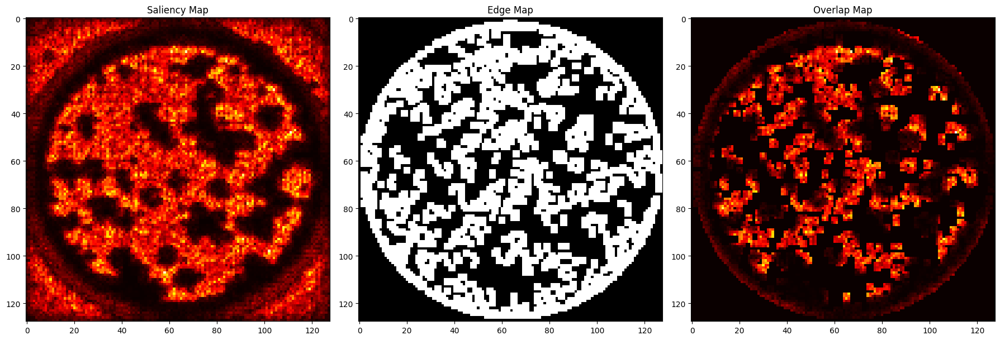

In [11]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# === Parameters ===
IMG_SIZE = (128, 128)  # Resize to 128x128 for the model
DATASET_DIR = Path("/kaggle/input/sickle-cell-disease-dataset") # Set the dataset directory here
CLEAR_DIR = os.path.join(DATASET_DIR, "Negative", "Clear")
UNLABELLED_DIR = os.path.join(DATASET_DIR, "Positive", "Unlabelled")

# === Scharr Edge Detection Function ===
def thick_scharr_mask(channel, threshold=100):
    grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
    mag = cv2.magnitude(grad_x, grad_y)
    mag = cv2.convertScaleAbs(mag)
    _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
    return mask

def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, IMG_SIZE)
    
    # Edge detection for each channel (RGB)
    r, g, b = cv2.split(img_resized)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)
    
    # Combine masks from all channels
    combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)
    
    # Morphological operation to clean up noise (optional)
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # Normalize edge mask
    edge_norm = clean_edge_mask / 255.0
    edge_norm = np.expand_dims(edge_norm, axis=-1)  # Add a channel dimension
    
    # Normalize the image
    img_norm = img_resized / 255.0
    
    # Return the concatenated image and edge map
    final_input = np.concatenate([img_norm, edge_norm], axis=-1)
    return final_input, edge_norm

# === Load Data ===
def load_dataset(negative_dir, positive_dir):
    X, y = [], []
    
    # Load negative samples (0)
    for img_file in tqdm(os.listdir(negative_dir), desc="Loading negative samples"):
        img_path = os.path.join(negative_dir, img_file)
        try:
            final_input, edge_norm = preprocess_image(img_path)
            X.append(final_input)
            y.append(0)
        except Exception as e:
            continue
    
    # Load positive samples (1)
    for img_file in tqdm(os.listdir(positive_dir), desc="Loading positive samples"):
        img_path = os.path.join(positive_dir, img_file)
        try:
            final_input, edge_norm = preprocess_image(img_path)
            X.append(final_input)
            y.append(1)
        except Exception as e:
            continue
    
    return np.array(X), np.array(y)

# === Define Classification Model ===
classification_model = models.Sequential([
    layers.Input(shape=(128, 128, 4)),  # 4 channels: RGB + edge mask
    layers.Conv2D(32, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu', padding='same'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, activation='relu', padding='same'),
    layers.GlobalAveragePooling2D(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # Binary classification output
])

classification_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# === Train the Model ===
# Load the data
X, y = load_dataset(CLEAR_DIR, UNLABELLED_DIR)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
history = classification_model.fit(X_train, y_train, validation_data=(X_val, y_val),
                                   epochs=5, batch_size=32)

# === Saliency Map Generation Function ===
def generate_saliency_map(model, image):
    # Convert image to tensor and add batch dimension
    image_tensor = tf.convert_to_tensor(image)
    image_tensor = tf.cast(image_tensor, tf.float32)
    image_tensor = image_tensor[None, ...]  # Add batch dimension
    
    with tf.GradientTape() as tape:
        tape.watch(image_tensor)
        prediction = model(image_tensor)  # Forward pass
    
    # Compute gradients of prediction w.r.t. image
    grads = tape.gradient(prediction, image_tensor)
    
    # Take the maximum gradient across channels
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]  # Remove batch dimension
    
    # Normalize the saliency map to range 0-1
    saliency = saliency.numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)

    return saliency

# === Calculate Overlap between Saliency and Edge Map ===
def calculate_overlap(saliency, edge_norm):
    # Threshold and squeeze edge map to 2D
    thresholded_edge_map = np.where(edge_norm > 0.5, 1, 0).squeeze()
    
    # Compute overlap (now both inputs are 2D)
    overlap_map = np.multiply(saliency, thresholded_edge_map)
    
    return overlap_map, thresholded_edge_map


# === Visualization ===
# === Modified Visualization Function ===
def visualize_maps(saliency, edge_map, overlap_map):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Saliency map (2D)
    axes[0].imshow(saliency, cmap='hot')
    axes[0].set_title("Saliency Map")
    
    # Edge map (2D after squeeze)
    axes[1].imshow(edge_map.squeeze(), cmap='gray')
    axes[1].set_title("Edge Map")
    
    # Overlap map (2D)
    axes[2].imshow(overlap_map, cmap='hot')
    axes[2].set_title("Overlap Map")
    
    plt.tight_layout()
    plt.show()



# === Example Usage ===
# Example image from validation set
image = X_val[0]  # Use the first image from the validation set

# Generate the saliency map
saliency = generate_saliency_map(classification_model, image)

# Get the edge map from preprocessing
_, edge_norm = preprocess_image(CLEAR_DIR + "/1.jpg")

# Calculate the overlap between saliency and edge map
overlap_map, thresholded_edge_map = calculate_overlap(saliency, edge_norm)

# Visualize the maps
visualize_maps(saliency, thresholded_edge_map, overlap_map)




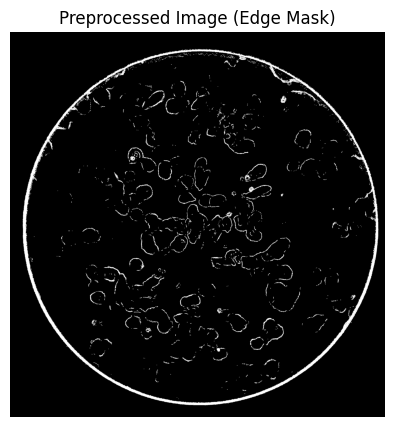

Found 544 images belonging to 2 classes.
Found 205 images belonging to 2 classes.
Epoch 1/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 200s 11s/step - accuracy: 0.7438 - loss: 0.6153 - val_accuracy: 0.7969 - val_loss: 0.4473
Epoch 2/10


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7692 - val_loss: 0.4609
Epoch 3/10
 4/17 ━━━━━━━━━━━━━━━━━━━━ 1:50 8s/step - accuracy: 0.8112 - loss: 0.4876

In [ ]:
import os
import random
import shutil
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from pathlib import Path

# Paths for the dataset
dataset_path = '/kaggle/input/sickle-cell-disease-dataset'
positive_path = os.path.join(dataset_path, 'Positive/Unlabelled')
negative_path = os.path.join(dataset_path, 'Negative/Clear')

# Create directories for train and validation data in the writable directory
train_dir = '/kaggle/working/train/'
validation_dir = '/kaggle/working/validation/'

os.makedirs(os.path.join(train_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'negative'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'negative'), exist_ok=True)

# Move positive images to train and validation sets
positive_images = [f for f in os.listdir(positive_path) if f.endswith('.jpg')]
random.shuffle(positive_images)
train_positive = positive_images[:int(0.8 * len(positive_images))]  # 80% for training
validation_positive = positive_images[int(0.8 * len(positive_images)):]  # 20% for validation

# Copy the images instead of moving
for img in train_positive:
    shutil.copy(os.path.join(positive_path, img), os.path.join(train_dir, 'positive', img))
for img in validation_positive:
    shutil.copy(os.path.join(positive_path, img), os.path.join(validation_dir, 'positive', img))

# Move negative images to train and validation sets
negative_images = [f for f in os.listdir(negative_path) if f.endswith('.jpg')]
random.shuffle(negative_images)
train_negative = negative_images[:int(0.8 * len(negative_images))]  # 80% for training
validation_negative = negative_images[int(0.8 * len(negative_images)):]  # 20% for validation

# Copy the negative images instead of moving
for img in train_negative:
    shutil.copy(os.path.join(negative_path, img), os.path.join(train_dir, 'negative', img))
for img in validation_negative:
    shutil.copy(os.path.join(negative_path, img), os.path.join(validation_dir, 'negative', img))

# Preprocessing function with Scharr edge detection, thresholding, and morphological operations
def preprocess_image(image_path):
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Split channels
    r, g, b = cv2.split(img_rgb)

    # Scharr + binary edge mask
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    # Get edge masks for each channel
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    # Combine edge masks
    combined_mask = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    # Morphological opening to remove noise
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    return clean_edge_mask

# Example of preprocessed image
image_example = '/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled/1.jpg'
preprocessed_example = preprocess_image(image_example)

# Display preprocessed image
plt.figure(figsize=(10, 5))
plt.imshow(preprocessed_example, cmap='gray')
plt.title("Preprocessed Image (Edge Mask)")
plt.axis('off')
plt.show()

# Set up image data generators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # VGG16 expects images of size 224x224
    batch_size=32,
    class_mode='binary'  # For binary classification (positive/negative)
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

# Load the pre-trained VGG16 model (without top layers)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model (not training it)
base_model.trainable = False

# Add custom layers on top for our task
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024, activation='relu'),
    layers.Dense(1, activation='sigmoid')  # For binary classification
])

# Compile the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=10,  # Adjust the number of epochs as needed
    validation_data=validation_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)

# Evaluate the model
val_loss, val_acc = model.evaluate(validation_generator)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_acc}")

# Fine-tune the model (Optional: Unfreeze layers of VGG for more training)
base_model.trainable = True
fine_tune_at = 100  # Fine-tune the layers starting from this index

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

# Continue training with the fine-tuned model
history_finetune = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

# Get the final training and validation accuracy
final_train_acc = history_finetune.history['accuracy'][-1]
final_val_acc = history_finetune.history['val_accuracy'][-1]

print(f"Final Training Accuracy: {final_train_acc:.4f}")
print(f"Final Validation Accuracy: {final_val_acc:.4f}")

# Plot training & validation accuracy values
plt.plot(history_finetune.history['accuracy'])
plt.plot(history_finetune.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_finetune.history['loss'])
plt.plot(history_finetune.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Save the model
model.save('/kaggle/working/sickle_cell_vgg_model.h5')


Found 454 images belonging to 2 classes.
Found 115 images belonging to 2 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


15/15 ━━━━━━━━━━━━━━━━━━━━ 20s 671ms/step - accuracy: 0.7237 - loss: 0.5345 - val_accuracy: 0.9565 - val_loss: 0.3112
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.8834 - loss: 0.2913 - val_accuracy: 0.9043 - val_loss: 0.2647
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - accuracy: 0.9554 - loss: 0.1774 - val_accuracy: 0.9217 - val_loss: 0.1910
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 174ms/step - accuracy: 0.9521 - loss: 0.1687 - val_accuracy: 0.9478 - val_loss: 0.1619
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - accuracy: 0.9678 - loss: 0.1165 - val_accuracy: 0.9391 - val_loss: 0.1450
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - accuracy: 0.9689 - loss: 0.1057 - val_accuracy: 0.9391 - val_loss: 0.1381
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - accuracy: 0.9798 - loss: 0.0890 - val_accuracy: 0.9478 - val_loss: 0.1309
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - accuracy: 0.9719 - loss: 0.0926 - val_accuracy: 0.9478 - val

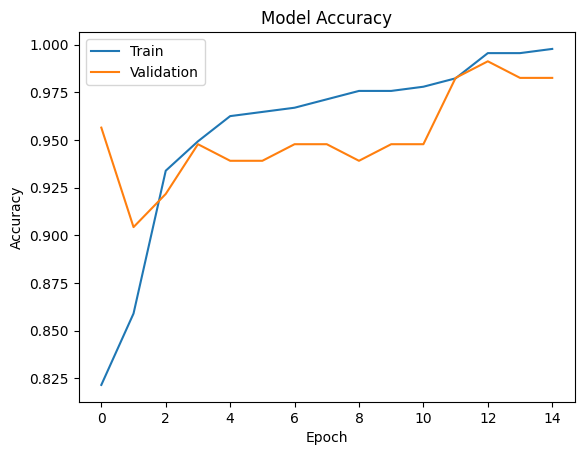

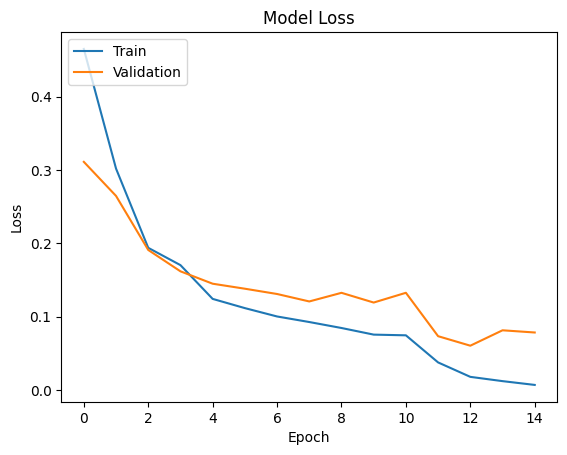

In [1]:
# Final Full Code: VGG16 on 128x128 images using Scharr Edge Detection and dataset in Kaggle working dir

import os
import cv2
import numpy as np
import random
import shutil
import matplotlib.pyplot as plt
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# === Constants and Paths ===
IMG_SIZE = (128, 128)
BASE_DIR = "/kaggle/input/sickle-cell-disease-dataset"
POSITIVE_DIR = os.path.join(BASE_DIR, "Positive", "Labelled")
NEGATIVE_DIR = os.path.join(BASE_DIR, "Negative", "Clear")

WORKING_DIR = "/kaggle/working"
TRAIN_DIR = os.path.join(WORKING_DIR, "train")
VAL_DIR = os.path.join(WORKING_DIR, "validation")

# Create necessary directories
for split in [TRAIN_DIR, VAL_DIR]:
    os.makedirs(os.path.join(split, "positive"), exist_ok=True)
    os.makedirs(os.path.join(split, "negative"), exist_ok=True)

# === Move images to working dir (copy due to readonly input dir) ===
def copy_images(src_dir, dest_dir, label, split_ratio=0.8):
    images = [f for f in os.listdir(src_dir) if f.endswith(".jpg")]
    random.shuffle(images)
    split = int(split_ratio * len(images))
    train_imgs, val_imgs = images[:split], images[split:]

    for img in train_imgs:
        shutil.copy(os.path.join(src_dir, img), os.path.join(dest_dir, "train", label, img))
    for img in val_imgs:
        shutil.copy(os.path.join(src_dir, img), os.path.join(dest_dir, "validation", label, img))

# Copy positive and negative images
copy_images(POSITIVE_DIR, WORKING_DIR, "positive")
copy_images(NEGATIVE_DIR, WORKING_DIR, "negative")

# === Data Generators ===
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary'
)

val_gen = val_datagen.flow_from_directory(
    VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary'
)

# === Load VGG16 and Add Custom Classifier ===
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
base_model.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# === Train the Model ===
history = model.fit(
    train_gen,
    epochs=10,
    validation_data=val_gen
)

# === Fine-Tuning ===
base_model.trainable = True
for layer in base_model.layers[:10]:
    layer.trainable = False

model.compile(optimizer=Adam(1e-5), loss='binary_crossentropy', metrics=['accuracy'])
history_finetune = model.fit(train_gen, epochs=5, validation_data=val_gen)

# === Plot Accuracy and Loss ===
plt.plot(history.history['accuracy'] + history_finetune.history['accuracy'])
plt.plot(history.history['val_accuracy'] + history_finetune.history['val_accuracy'])
plt.title("Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

plt.plot(history.history['loss'] + history_finetune.history['loss'])
plt.plot(history.history['val_loss'] + history_finetune.history['val_loss'])
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.show()

# Save model
model.save(os.path.join(WORKING_DIR, "vgg_sickle_model.h5"))


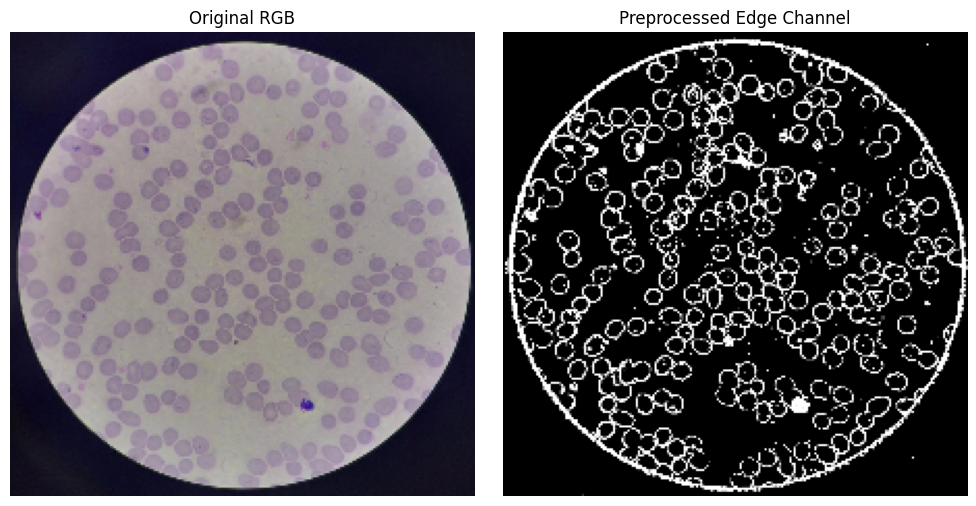

In [9]:
import cv2
import numpy as np

def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    # Morphological Opening
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)

    # Resize image and mask (if needed)
    img_rgb_resized = cv2.resize(img_rgb, target_size)
    edge_mask_resized = cv2.resize(clean_edge_mask_or, target_size)

    # Normalize edge mask and expand dims
    edge_mask_resized = edge_mask_resized.astype(np.float32) / 255.0
    edge_mask_resized = np.expand_dims(edge_mask_resized, axis=-1)

    # Stack RGB + edge to make 4-channel input
    preprocessed = np.concatenate((img_rgb_resized / 255.0, edge_mask_resized), axis=-1)
    return preprocessed
sample_image_path = os.path.join(train_dir, 'negative','1.jpg')
preprocessed_sample = preprocess_image(sample_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(preprocessed_sample[..., :3])
plt.title("Original RGB")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(preprocessed_sample[..., 3], cmap='gray')
plt.title("Preprocessed Edge Channel")
plt.axis('off')
plt.tight_layout()
plt.show()

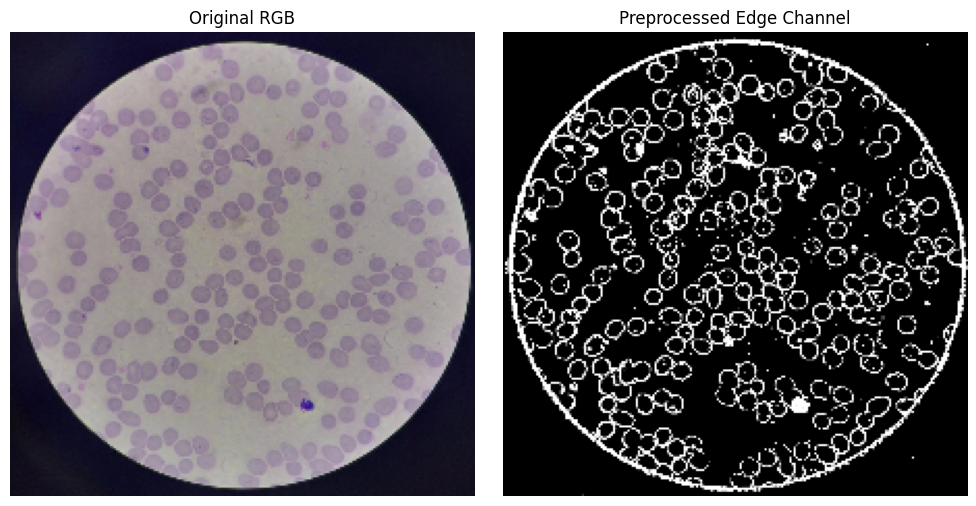

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 95s 18s/step - accuracy: 0.5214 - auc: 0.5491 - loss: 0.7523 - precision: 0.5169 - recall: 0.7094 - val_accuracy: 0.5000 - val_auc: 0.7609 - val_loss: 0.6878 - val_precision: 1.0000 - val_recall: 0.0312
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.5823 - auc: 0.6536 - loss: 0.6632 - precision: 0.6138 - recall: 0.4396 - val_accuracy: 0.7903 - val_auc: 0.8188 - val_loss: 0.6109 - val_precision: 0.8065 - val_recall: 0.7812
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 31s 8s/step - accuracy: 0.6641 - auc: 0.7477 - loss: 0.6038 - precision: 0.6308 - recall: 0.7937 - val_accuracy: 0.7742 - val_auc: 0.8370 - val_loss: 0.5795 - val_precision: 0.8462 - val_recall: 0.6875
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 31s 8s/step - accuracy: 0.7099 - auc: 0.7551 - loss: 0.5856 - precision: 0.7034 - recall: 0.7302 - val_accuracy: 0.6935 - val_auc: 0.8505 - val_loss: 0.5631 - val_precision: 0.8824 - val_recall: 0.4

In [4]:
import os
import cv2
import numpy as np
import random
import shutil
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# === Paths ===
dataset_path = '/kaggle/input/sickle-cell-disease-dataset'
positive_path = os.path.join(dataset_path, 'Positive/Unlabelled')
negative_path = os.path.join(dataset_path, 'Negative/Clear')
train_dir = '/kaggle/working/train'
validation_dir = '/kaggle/working/validation'

# === Create directories ===
os.makedirs(os.path.join(train_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'negative'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'negative'), exist_ok=True)

# === Move images (copy instead due to read-only input dir) ===
def split_and_copy(src_dir, dst_train, dst_val):
    images = [f for f in os.listdir(src_dir) if f.endswith('.jpg')]
    random.shuffle(images)
    split_idx = int(0.8 * len(images))
    for i, img in enumerate(images):
        src = os.path.join(src_dir, img)
        dst = os.path.join(dst_train if i < split_idx else dst_val, img)
        shutil.copy(src, dst)

split_and_copy(positive_path, os.path.join(train_dir, 'positive'), os.path.join(validation_dir, 'positive'))
split_and_copy(negative_path, os.path.join(train_dir, 'negative'), os.path.join(validation_dir, 'negative'))

# === Preprocessing: Scharr edges ===
IMG_SIZE = (224, 224)

# Utility to load image paths and labels
def load_image_paths(folder, label):
    return [
        (os.path.join(folder, fname), label)
        for fname in os.listdir(folder)
        if fname.lower().endswith('.jpg')
    ]


def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    # Morphological Opening
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)

    # Resize image and mask (if needed)
    img_rgb_resized = cv2.resize(img_rgb, target_size)
    edge_mask_resized = cv2.resize(clean_edge_mask_or, target_size)

    # Normalize edge mask and expand dims
    edge_mask_resized = edge_mask_resized.astype(np.float32) / 255.0
    edge_mask_resized = np.expand_dims(edge_mask_resized, axis=-1)

    # Stack RGB + edge to make 4-channel input
    preprocessed = np.concatenate((img_rgb_resized / 255.0, edge_mask_resized), axis=-1)
    return preprocessed
sample_image_path = os.path.join(train_dir, 'negative','1.jpg')
preprocessed_sample = preprocess_image(sample_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(preprocessed_sample[..., :3])
plt.title("Original RGB")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(preprocessed_sample[..., 3], cmap='gray')
plt.title("Preprocessed Edge Channel")
plt.axis('off')
plt.tight_layout()
plt.show()

# === Data Generator ===
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_dir, batch_size=32):
        self.image_paths = [
            os.path.join(image_dir, fname)
            for fname in os.listdir(image_dir)
            if fname.lower().endswith('.jpg')
        ]

        self.batch_size = batch_size
        self.labels = [1 if 'positive' in image_dir else 0] * len(self.image_paths)

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, idx):
        batch_paths = self.image_paths[idx * self.batch_size: (idx + 1) * self.batch_size]
        batch_images = np.array([preprocess_image(p) for p in batch_paths])
        batch_labels = np.array(self.labels[idx * self.batch_size: (idx + 1) * self.batch_size])
        return batch_images, batch_labels

# === Generators ===
train_gen_pos = CustomDataGenerator(os.path.join(train_dir, 'positive'))
train_gen_neg = CustomDataGenerator(os.path.join(train_dir, 'negative'))
val_gen_pos = CustomDataGenerator(os.path.join(validation_dir, 'positive'))
val_gen_neg = CustomDataGenerator(os.path.join(validation_dir, 'negative'))

def combine_generators(*gens):
    while True:
        all_batches = [next(iter(g)) for g in gens]
        x = np.concatenate([b[0] for b in all_batches])
        y = np.concatenate([b[1] for b in all_batches])
        idx = np.arange(len(x))
        np.random.shuffle(idx)
        yield x[idx], y[idx]

train_gen = combine_generators(train_gen_pos, train_gen_neg)
val_gen = combine_generators(val_gen_pos, val_gen_neg)

# === Model ===
def build_model():
    input_tensor = layers.Input(shape=(224, 224, 4), name="input_4ch")
    
    # Convert 4 channels (RGB + edge) to 3 channels for VGG16
    conv_to_rgb = layers.Conv2D(3, (1, 1), activation='linear', name='conv_to_rgb')(input_tensor)

    # Load VGG16 model (WITHOUT using input_tensor argument!)
    base = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
    base.trainable = False

    # Feed our converted RGB tensor into VGG
    x = base(conv_to_rgb)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    output = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs=input_tensor, outputs=output)
    return model

model1 = build_model()
model1.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy',tf.keras.metrics.AUC(),
            tf.keras.metrics.Precision(),
            tf.keras.metrics.Recall()])

# === Train ===
steps_per_epoch = min(len(train_gen_pos), len(train_gen_neg))
validation_steps = min(len(val_gen_pos), len(val_gen_neg))

history = model1.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    epochs=10
)

# === Save model ===
model1.save("/kaggle/working/sickle_cell_vgg_model.h5")


In [5]:
history.history

{'accuracy': [0.5234375,
  0.6015625,
  0.66015625,
  0.71484375,
  0.7578125,
  0.796875,
  0.8046875,
  0.83984375,
  0.8125,
  0.8515625],
 'auc': [0.555938720703125,
  0.669158935546875,
  0.734100341796875,
  0.752288818359375,
  0.842193603515625,
  0.873046875,
  0.88299560546875,
  0.90966796875,
  0.909088134765625,
  0.926177978515625],
 'loss': [0.7356410026550293,
  0.6494442224502563,
  0.6123294830322266,
  0.5809000134468079,
  0.5084047317504883,
  0.4690749943256378,
  0.44141799211502075,
  0.4039723873138428,
  0.3999934792518616,
  0.3670578598976135],
 'precision': [0.5227272510528564,
  0.6274510025978088,
  0.6305732727050781,
  0.7200000286102295,
  0.8586956262588501,
  0.8454545736312866,
  0.8421052694320679,
  0.8990825414657593,
  0.8921568393707275,
  0.932692289352417],
 'recall': [0.5390625,
  0.5,
  0.7734375,
  0.703125,
  0.6171875,
  0.7265625,
  0.75,
  0.765625,
  0.7109375,
  0.7578125],
 'val_accuracy': [0.5,
  0.7903226017951965,
  0.77419352531

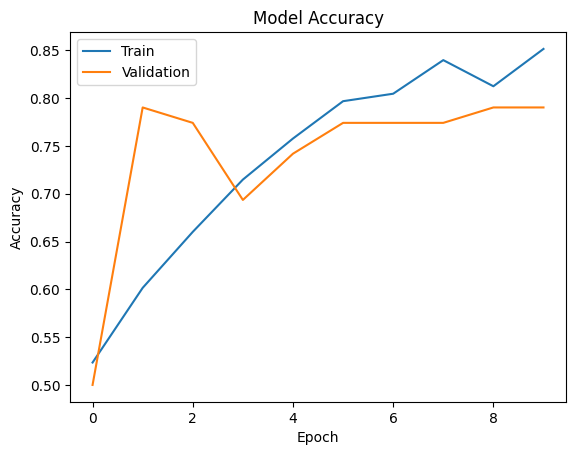

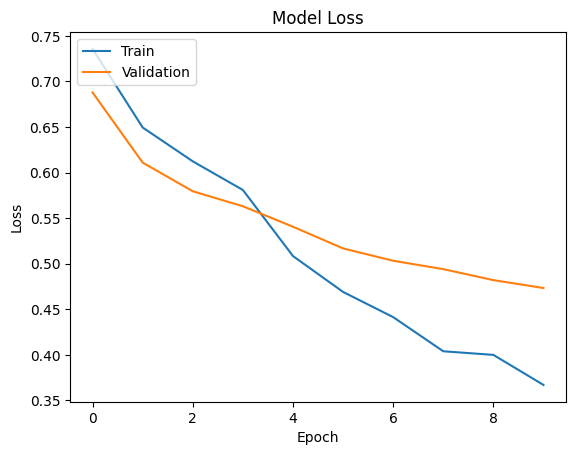

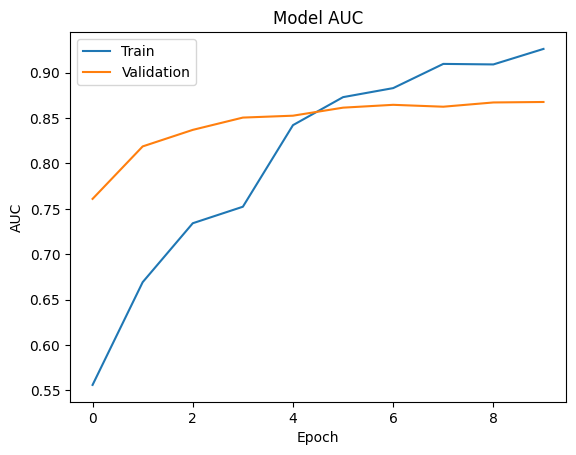

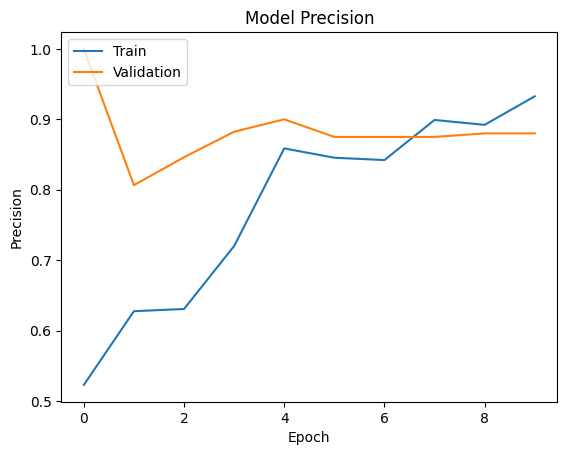

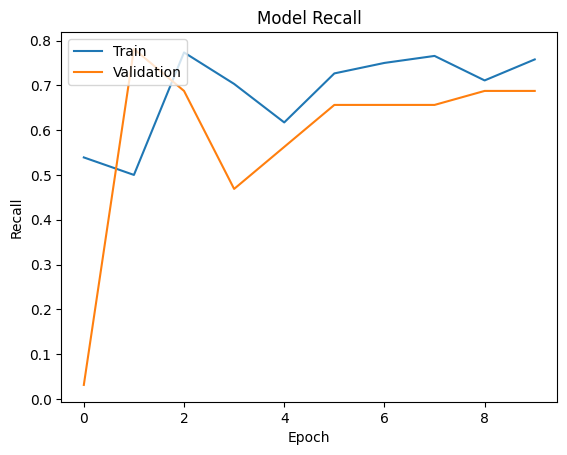

In [6]:
output_dir = "/kaggle/working/plots"
os.makedirs(output_dir, exist_ok=True)

# Plot and save accuracy
plt.figure()
plt.plot(history.history['accuracy'])  # Only use 'history' here
plt.plot(history.history['val_accuracy'])  # Only use 'history' here
plt.title("Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "accuracy.png"))
plt.show()

# Plot and save loss
plt.figure()
plt.plot(history.history['loss'])  # Only use 'history' here
plt.plot(history.history['val_loss'])  # Only use 'history' here
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "loss.png"))
plt.show()

plt.figure()
plt.plot(history.history['auc'])  # Only use 'history' here
plt.plot(history.history['val_auc'])  # Only use 'history' here
plt.title("Model AUC")
plt.ylabel("AUC")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "auc.png"))
plt.show()

plt.figure()
plt.plot(history.history['precision'])  # Only use 'history' here
plt.plot(history.history['val_precision'])  # Only use 'history' here
plt.title("Model Precision")
plt.ylabel("Precision")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "precision.png"))
plt.show()

plt.figure()
plt.plot(history.history['recall'])  # Only use 'history' here
plt.plot(history.history['val_recall'])  # Only use 'history' here
plt.title("Model Recall")
plt.ylabel("Recall")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "recall.png"))
plt.show()


In [7]:
import shutil
import os

# Source and destination directories
source_dir = '/kaggle/working/plots'
destination_dir = '/kaggle/working/plots/vgg'

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Copy all contents from source to destination
shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True)

print(f"All files from {source_dir} have been copied to {destination_dir}")


All files from /kaggle/working/plots have been copied to /kaggle/working/plots/vgg


In [29]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

# Make sure the necessary parts of the code for Grad-CAM are defined

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, classifier_layer_names):
    # Get the VGG16 submodel (or base model)
    vgg16_model = model.get_layer('vgg16')

    # Create a model that maps the input image to the activations of the last conv layer
    last_conv_layer = vgg16_model.get_layer(last_conv_layer_name)
    last_conv_model = tf.keras.Model(inputs=vgg16_model.input, outputs=last_conv_layer.output)

    # Create a model that maps the activations to the final output
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = tf.keras.Model(classifier_input, x)

    # Compute the gradient of the top predicted class
    with tf.GradientTape() as tape:
        conv_output = last_conv_model(img_array)
        tape.watch(conv_output)
        preds = classifier_model(conv_output)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # Gradients
    grads = tape.gradient(class_channel, conv_output)

    # Global average pooling to get importance
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply pooled grads with feature map
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, alpha=0.4):
    # Load the image
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize heatmap to image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply colormap
    heatmap = np.uint8(255 * heatmap)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose heatmap onto image
    superimposed_img = heatmap_colored * alpha + img

    # Plot
    plt.figure(figsize=(8, 8))
    plt.imshow(np.uint8(superimposed_img))
    plt.axis('off')
    plt.title("Grad-CAM")
    plt.show()

# Load and preprocess image
img_path = '/kaggle/working/train/positive/1.jpg'  # Update with your image path
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = tf.keras.applications.vgg16.preprocess_input(img_array)

# Trigger model once
_ = model1.predict(img_array)

# Apply Grad-CAM
heatmap = make_gradcam_heatmap(
    img_array,
    model1,
    last_conv_layer_name='block5_conv3',  # Last convolutional layer
    classifier_layer_names=['global_average_pooling2d_3', 'dense_6', 'dropout_2', 'dense_7']
)

# Display result
save_and_display_gradcam(img_path, heatmap)


InvalidArgumentError: Graph execution error:

Detected at node convolution defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-29-bc7ac8626f5c>", line 77, in <cell line: 77>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 512, in predict

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 208, in one_step_on_data_distributed

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 198, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 96, in predict_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 175, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 560, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py", line 243, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py", line 233, in convolution_op

  File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py", line 901, in conv

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 256, in conv

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 244, in _conv_xla

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 231, in _conv

Depth of input must be a multiple of depth of filter: 3 vs 4

Stack trace for op definition: 
File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>
File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start
File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start
File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once
File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>
File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request
File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper
File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute
File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell
File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes
File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
File "<ipython-input-29-bc7ac8626f5c>", line 77, in <cell line: 77>
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 512, in predict
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 208, in one_step_on_data_distributed
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 198, in one_step_on_data
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 96, in predict_step
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 175, in call
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph
File "/usr/local/lib/python3.10/dist-packages/keras/src/models/functional.py", line 560, in call
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py", line 901, in __call__
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/operation.py", line 46, in __call__
File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler
File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py", line 243, in call
File "/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py", line 233, in convolution_op
File "/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py", line 901, in conv
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 256, in conv
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 244, in _conv_xla
File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py", line 231, in _conv

	 [[{{node convolution}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_19148[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_data_distributed_19215]

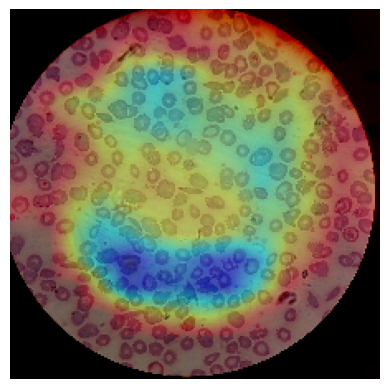

In [23]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    # Create a model that maps the input image to the activations of the last convolutional layer and the model's predictions
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Get the gradient of the class with respect to the output feature map of the last convolutional layer
    with tf.GradientTape() as tape:
        # Watch the input image and get model outputs
        last_conv_layer_output, preds = grad_model(img_array)
        tape.watch(last_conv_layer_output)
        class_channel = preds[:, np.argmax(preds[0])]

    # Calculate the gradient of the class output with respect to the last conv layer feature map
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pool the gradients across all the axes (average over width and height)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel of the feature map by the "importance" of that channel
    last_conv_layer_output = last_conv_layer_output[0].numpy()  # Convert tensor to numpy array
    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i].numpy()  # Convert to numpy and apply scaling

    # Calculate the heatmap by summing over all channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # Normalize the heatmap to the range [0, 1]
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay the heatmap on the image
def overlay_gradcam(heatmap, img_array, alpha=0.4):
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Convert the heatmap to a jet colormap
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose the heatmap on the original image
    superimposed_img = heatmap * alpha + img_array[0]
    superimposed_img = np.uint8(np.clip(superimposed_img, 0, 255))

    return superimposed_img


# Load the pre-trained model (VGG16 in this case)
base_model = tf.keras.applications.VGG16(weights='imagenet')

# Add custom layers if necessary (if you have a custom model like in your case)
# model1 = ... (your custom model, in your case 'model1')

# Identify the last convolutional layer's name (VGG16 has 'block5_conv3' as its last conv layer)
last_conv_layer_name = 'block5_conv3'

img_path = '/kaggle/working/train/positive/10.jpg'  # Update with your image path
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = tf.keras.applications.vgg16.preprocess_input(img_array)

# Apply Grad-CAM
heatmap = make_gradcam_heatmap(img_array, base_model, last_conv_layer_name)

# Overlay Grad-CAM heatmap on the original image
superimposed_img = overlay_gradcam(heatmap, img_array)

# Display the superimposed image
plt.imshow(superimposed_img)
plt.axis('off')  # Hide axis
plt.show()


In [21]:
!ls /kaggle/working/train/positive

101.jpg  143.jpg  188.jpg  22.jpg   279.jpg  322.jpg  361.jpg  405.jpg	65.jpg
102.jpg  144.jpg  189.jpg  230.jpg  280.jpg  323.jpg  363.jpg  406.jpg	67.jpg
103.jpg  145.jpg  18.jpg   231.jpg  282.jpg  324.jpg  365.jpg  407.jpg	68.jpg
104.jpg  147.jpg  191.jpg  232.jpg  283.jpg  326.jpg  366.jpg  408.jpg	69.jpg
105.jpg  148.jpg  193.jpg  233.jpg  284.jpg  327.jpg  367.jpg  409.jpg	6.jpg
106.jpg  149.jpg  194.jpg  235.jpg  285.jpg  328.jpg  368.jpg  40.jpg	70.jpg
107.jpg  150.jpg  197.jpg  236.jpg  287.jpg  329.jpg  370.jpg  410.jpg	71.jpg
108.jpg  151.jpg  198.jpg  237.jpg  288.jpg  32.jpg   373.jpg  411.jpg	72.jpg
109.jpg  153.jpg  199.jpg  238.jpg  289.jpg  330.jpg  375.jpg  412.jpg	73.jpg
10.jpg	 154.jpg  19.jpg   241.jpg  290.jpg  331.jpg  376.jpg  413.jpg	74.jpg
110.jpg  155.jpg  200.jpg  242.jpg  291.jpg  332.jpg  377.jpg  416.jpg	75.jpg
111.jpg  156.jpg  201.jpg  243.jpg  292.jpg  333.jpg  378.jpg  417.jpg	76.jpg
113.jpg  157.jpg  203.jpg  244.jpg  293.jpg  334.jpg  379.jpg  418.

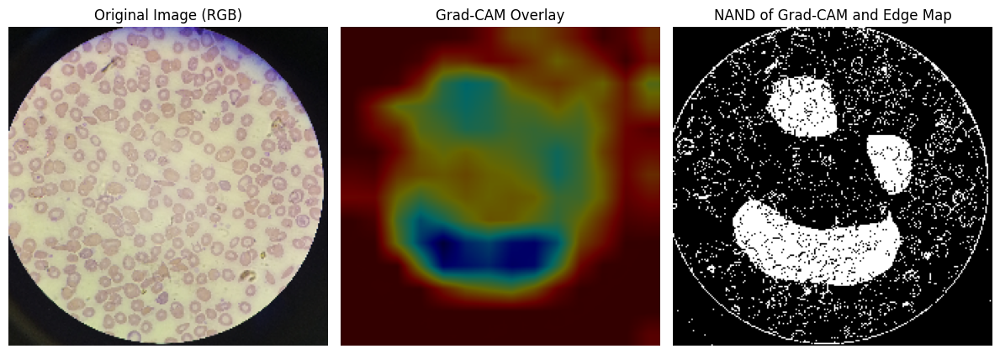

In [31]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to overlay the heatmap on the image
# Function to overlay the heatmap on the image
def overlay_gradcam(heatmap, img_array, alpha=0.4):
    # Resize the heatmap to match the image size
    heatmap_resized = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Convert the heatmap to a jet colormap
    heatmap_resized = np.uint8(255 * heatmap_resized)  # Convert to 0-255 range
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Extract only the RGB channels of the original image (ignore the edge map channel)
    img_rgb = img_array[0, :, :, :3]  # Shape: (224, 224, 3)

    # Superimpose the heatmap on the RGB image
    superimposed_img = heatmap_resized * alpha + img_rgb
    superimposed_img = np.uint8(np.clip(superimposed_img, 0, 255))

    return superimposed_img


# Function to compute the NAND operation
# Function to compute the NAND operation
def nand_operation(gradcam, edge_map):
    # Resize the Grad-CAM heatmap to match the edge map size (224x224)
    gradcam_resized = cv2.resize(gradcam, (edge_map.shape[1], edge_map.shape[0]))

    # Threshold Grad-CAM heatmap to binary (e.g., values > 0.5 are considered 1, else 0)
    gradcam_binary = 1-((gradcam_resized > 0.5).astype(np.uint8))
    
    # Threshold edge map to binary (e.g., values > 0.5 are considered 1, else 0)
    edge_map_binary = (edge_map > 0.5).astype(np.uint8)

    # Perform the NAND operation: (A AND B) = 1 only if both A and B are not 1
    nand_result = np.bitwise_xor(gradcam_binary, edge_map_binary)  # AND first
    nand_result = np.invert(nand_result)  # Apply NOT to get NAND

    return nand_result


# Assuming the 'preprocess_image' function is already defined
def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Scharr Edge Detection
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)

    img_rgb_resized = cv2.resize(img_rgb, target_size)
    edge_mask_resized = cv2.resize(clean_edge_mask_or, target_size)

    edge_mask_resized = edge_mask_resized.astype(np.float32) / 255.0
    edge_mask_resized = np.expand_dims(edge_mask_resized, axis=-1)

    preprocessed = np.concatenate((img_rgb_resized / 255.0, edge_mask_resized), axis=-1)
    return preprocessed

# Replace this with your actual image path
sample_image_path = '/kaggle/working/train/positive/10.jpg'  # Provide the actual path here

# Preprocess the sample image (RGB + Edge map)
preprocessed_sample = preprocess_image(sample_image_path)

# Extract the edge map (the 4th channel)
edge_map = preprocessed_sample[..., 3]  # Shape: (224, 224)

# Add batch dimension to the preprocessed image
img_array = np.expand_dims(preprocessed_sample, axis=0)

# Load the pre-trained VGG16 model (or your custom model)
base_model = tf.keras.applications.VGG16(weights='imagenet')

# Identify the last convolutional layer's name (for VGG16, it's 'block5_conv3')

# Perform NAND operation between Grad-CAM and edge map
nand_result = nand_operation(heatmap, edge_map)

# Overlay Grad-CAM heatmap on the original image
superimposed_img = overlay_gradcam(heatmap, img_array)

# Plot the results
plt.figure(figsize=(12, 6))

# Original image (RGB channels only)
plt.subplot(1, 3, 1)
plt.imshow(preprocessed_sample[..., :3])  # Show the original RGB channels
plt.title('Original Image (RGB)')
plt.axis('off')

# Grad-CAM overlayed on the image
plt.subplot(1, 3, 2)
plt.imshow(superimposed_img)
plt.title('Grad-CAM Overlay')
plt.axis('off')

# NAND operation result
plt.subplot(1, 3, 3)
plt.imshow(nand_result, cmap='gray')
plt.title('NAND of Grad-CAM and Edge Map')
plt.axis('off')

plt.tight_layout()
plt.show()


In [10]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    # Create a model that maps the input image to the activations of the last convolutional layer and the model's predictions
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Get the gradient of the class with respect to the output feature map of the last convolutional layer
    with tf.GradientTape() as tape:
        # Watch the input image and get model outputs
        last_conv_layer_output, preds = grad_model(img_array)
        tape.watch(last_conv_layer_output)
        class_channel = preds[:, np.argmax(preds[0])]  # Get the class with the highest probability

    # Calculate the gradient of the class output with respect to the last conv layer feature map
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pool the gradients across all the axes (average over width and height)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel of the feature map by the "importance" of that channel
    last_conv_layer_output = last_conv_layer_output[0].numpy()  # Convert tensor to numpy array
    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i].numpy()  # Convert to numpy and apply scaling

    # Calculate the heatmap by summing over all channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # Normalize the heatmap to the range [0, 1]
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay the heatmap on the image
def overlay_gradcam(heatmap, img_array, alpha=0.4):
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Convert the heatmap to a jet colormap
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Extract only the RGB channels (the first 3 channels)
    img_rgb = img_array[0, :, :, :3]  # Take the first image, and select only the first 3 channels (RGB)

    # Superimpose the heatmap on the RGB image
    superimposed_img = heatmap * alpha + img_rgb  # Add heatmap to RGB channels
    superimposed_img = np.uint8(np.clip(superimposed_img, 0, 255))  # Ensure values are in the [0, 255] range

    return superimposed_img


# Dynamically find the last convolutional layer in model1
last_conv_layer_name = None
for layer in model1.layers:
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name = layer.name

# Load and preprocess the image (using your 4-channel preprocessing function)
img_path = '/kaggle/working/train/positive/10.jpg'  # Update with your image path
img_array = preprocess_image(img_path, target_size=(224, 224))  # Ensure image size matches model input

# Expand dims to match the batch size (1, 224, 224, 4)
img_array = np.expand_dims(img_array, axis=0)

# Apply Grad-CAM on model1
heatmap = make_gradcam_heatmap(img_array, model1, last_conv_layer_name)

# Overlay Grad-CAM heatmap on the original image
superimposed_img = overlay_gradcam(heatmap, img_array)

# Display the superimposed image
# Save the superimposed image
plt.imshow(superimposed_img)
plt.axis('off')  # Hide axis
plt.savefig('/kaggle/working/superimposed_img.png', bbox_inches='tight', pad_inches=0)
plt.close()  # Close the plot to avoid overlap in the next plot

# Save the heatmap
plt.imshow(heatmap)
plt.axis('off')  # Hide axis
plt.savefig('/kaggle/working/heatmap.png', bbox_inches='tight', pad_inches=0)
plt.close()  # Close the plot


In [32]:
import os
import cv2
import numpy as np
import random
import shutil
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

# Function to preprocess image (this will return RGB + Edge map combined)
def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    # Morphological Opening
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)

    # Resize image and mask (if needed)
    img_rgb_resized = cv2.resize(img_rgb, target_size)
    edge_mask_resized = cv2.resize(clean_edge_mask_or, target_size)

    # Normalize edge mask and expand dims
    edge_mask_resized = edge_mask_resized.astype(np.float32) / 255.0
    edge_mask_resized = np.expand_dims(edge_mask_resized, axis=-1)

    # Stack RGB + edge to make 4-channel input
    preprocessed = np.concatenate((img_rgb_resized / 255.0, edge_mask_resized), axis=-1)
    return preprocessed

# Use VGG16 as feature extractor (excluding top layers)
def extract_features(image_paths):
    base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
    model = models.Model(inputs=base_model.input, outputs=base_model.output)

    features = []
    for image_path in image_paths:
        # Preprocess image (note: using only the RGB channels here)
        preprocessed_image = preprocess_image(image_path)
        img_rgb = preprocessed_image[..., :3]  # Extract RGB (ignore edge map for feature extraction)
        img_rgb = np.expand_dims(img_rgb, axis=0)  # Add batch dimension
        
        # Extract features using VGG16 (flatten output of last convolutional layer)
        feature_vector = model.predict(img_rgb)
        feature_vector = feature_vector.flatten()  # Flatten the feature vector
        features.append(feature_vector)
    
    return np.array(features)

# Get paths to positive and negative images
positive_path = '/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled'
negative_path = '/kaggle/input/sickle-cell-disease-dataset/Negative/Clear'

positive_images = [os.path.join(positive_path, fname) for fname in os.listdir(positive_path) if fname.endswith('.jpg')]
negative_images = [os.path.join(negative_path, fname) for fname in os.listdir(negative_path) if fname.endswith('.jpg')]

# Combine positive and negative images
image_paths = positive_images + negative_images
labels = [1] * len(positive_images) + [0] * len(negative_images)  # 1 for positive, 0 for negative

# Extract features using VGG16
features = extract_features(image_paths)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train an SVM classifier
svm_classifier = svm.SVC(kernel='linear')  # You can change kernel to 'rbf' or others if needed
svm_classifier.fit(X_train, y_train)

# Make predictions
y_pred = svm_classifier.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━

In [46]:
import os
import cv2
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image

# Function to preprocess image (this will return RGB + Edge map combined)
def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    # Stack the edge maps (R, G, B edge maps)
    combined_edge_map = np.stack([r_mask, g_mask, b_mask], axis=-1)

    # Resize the edge maps to target size (224, 224)
    edge_map_resized = cv2.resize(combined_edge_map, target_size)
    
    # Normalize edge map (for neural network input)
    edge_map_resized = edge_map_resized.astype(np.float32) / 255.0
    return edge_map_resized

# Function to extract features using VGG16
def extract_features(image_paths):
    # Load VGG16 without the top layer for feature extraction
    base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
    model = models.Model(inputs=base_model.input, outputs=base_model.output)

    features = []
    for image_path in image_paths:
        # Preprocess image (use the edge map as input to VGG16)
        edge_map = preprocess_image(image_path)

        # Expand dims to match the expected input shape (batch_size, height, width, channels)
        edge_map = np.expand_dims(edge_map, axis=0)

        # Extract features using VGG16 (output of last convolutional layer)
        feature_vector = model.predict(edge_map)
        feature_vector = feature_vector.flatten()  # Flatten the feature vector to 1D
        features.append(feature_vector)

    return np.array(features)

# Get paths to positive and negative images
positive_path = '/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled'
negative_path = '/kaggle/input/sickle-cell-disease-dataset/Negative/Clear'

positive_images = [os.path.join(positive_path, fname) for fname in os.listdir(positive_path) if fname.endswith('.jpg')]
negative_images = [os.path.join(negative_path, fname) for fname in os.listdir(negative_path) if fname.endswith('.jpg')]

# Combine positive and negative images
image_paths = positive_images + negative_images
labels = [1] * len(positive_images) + [0] * len(negative_images)  # 1 for positive, 0 for negative

# Extract features using VGG16 (based on edge maps)
features = extract_features(image_paths)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train an SVM classifier
svm_classifier = svm.SVC(kernel='linear')  # You can change kernel to 'rbf' or others if needed
svm_classifier.fit(X_train, y_train)

# Make predictions
y_pred = svm_classifier.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━

In [47]:
import os
import cv2
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tensorflow.keras.applications import VGG16
from tensorflow.keras import models, layers
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt

# Function to preprocess image (this will return RGB + Edge map combined)
def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    # Stack the edge maps (R, G, B edge maps)
    combined_edge_map = np.stack([r_mask, g_mask, b_mask], axis=-1)

    # Resize the edge maps to target size (224, 224)
    edge_map_resized = cv2.resize(combined_edge_map, target_size)
    
    # Normalize edge map (for neural network input)
    edge_map_resized = edge_map_resized.astype(np.float32) / 255.0
    return edge_map_resized

# Function to extract features using VGG16
def extract_features(image_paths):
    # Load VGG16 without the top layer for feature extraction
    base_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
    model = models.Model(inputs=base_model.input, outputs=base_model.output)

    features = []
    for image_path in image_paths:
        # Preprocess image (use the edge map as input to VGG16)
        edge_map = preprocess_image(image_path)

        # Expand dims to match the expected input shape (batch_size, height, width, channels)
        edge_map = np.expand_dims(edge_map, axis=0)

        # Extract features using VGG16 (output of last convolutional layer)
        feature_vector = model.predict(edge_map)
        feature_vector = feature_vector.flatten()  # Flatten the feature vector to 1D
        features.append(feature_vector)

    return np.array(features)

# Function to generate Grad-CAM heatmap
def generate_gradcam_heatmap(model, image, last_conv_layer_name='block5_conv3'):
    # Get the model's last convolutional layer's output
    last_conv_layer = model.get_layer(last_conv_layer_name)
    
    # Get the gradient of the class output with respect to the last convolutional layer
    with K.GradientTape() as tape:
        tape.watch(last_conv_layer.output)
        preds = model(image)
        class_idx = np.argmax(preds[0])
        class_output = preds[:, class_idx]
    
    # Get the gradients of the output with respect to the last convolutional layer
    grads = tape.gradient(class_output, last_conv_layer.output)
    
    # Compute the pooled gradients (average over all channels)
    pooled_grads = K.mean(grads, axis=(0, 1, 2)).numpy()
    
    # Get the output of the last convolutional layer
    last_conv_layer_output = last_conv_layer.output.numpy()[0]
    
    # Multiply each channel by the corresponding gradient value
    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]
    
    # Compute the heatmap by averaging over all channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)
    
    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    return heatmap

# Function to overlay Grad-CAM heatmap on the original edge map
def overlay_gradcam(heatmap, edge_map, alpha=0.4):
    # Resize heatmap to match edge map size
    heatmap_resized = cv2.resize(heatmap, (edge_map.shape[1], edge_map.shape[0]))

    # Convert the heatmap to a jet colormap
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Superimpose the heatmap on the original image
    superimposed_img = cv2.addWeighted(edge_map, 1 - alpha, heatmap_resized, alpha, 0)

    return superimposed_img

# Get paths to positive and negative images
positive_path = '/kaggle/input/sickle-cell-disease-dataset/Positive/Unlabelled'
negative_path = '/kaggle/input/sickle-cell-disease-dataset/Negative/Clear'

positive_images = [os.path.join(positive_path, fname) for fname in os.listdir(positive_path) if fname.endswith('.jpg')]
negative_images = [os.path.join(negative_path, fname) for fname in os.listdir(negative_path) if fname.endswith('.jpg')]

# Combine positive and negative images
image_paths = positive_images + negative_images
labels = [1] * len(positive_images) + [0] * len(negative_images)  # 1 for positive, 0 for negative

# Extract features using VGG16 (based on edge maps)
features = extract_features(image_paths)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train an SVM classifier
svm_classifier = svm.SVC(kernel='linear')  # You can change kernel to 'rbf' or others if needed
svm_classifier.fit(X_train, y_train)

# Make predictions
y_pred = svm_classifier.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Visualizing Grad-CAM on some test images
for image_path in X_test[:3]:  # Display Grad-CAM for the first 3 test images
    edge_map = preprocess_image(image_path)
    edge_map_input = np.expand_dims(edge_map, axis=0)
    
    # Generate Grad-CAM heatmap
    heatmap = generate_gradcam_heatmap(svm_classifier, edge_map_input)
    
    # Overlay the Grad-CAM heatmap
    gradcam_overlay = overlay_gradcam(heatmap, edge_map)
    
    # Plot the image and Grad-CAM overlay
    plt.imshow(gradcam_overlay)
    plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━

FileNotFoundError: Image not found or unreadable: [0.11300388 0.         0.         ... 0.         1.0928574  0.        ]

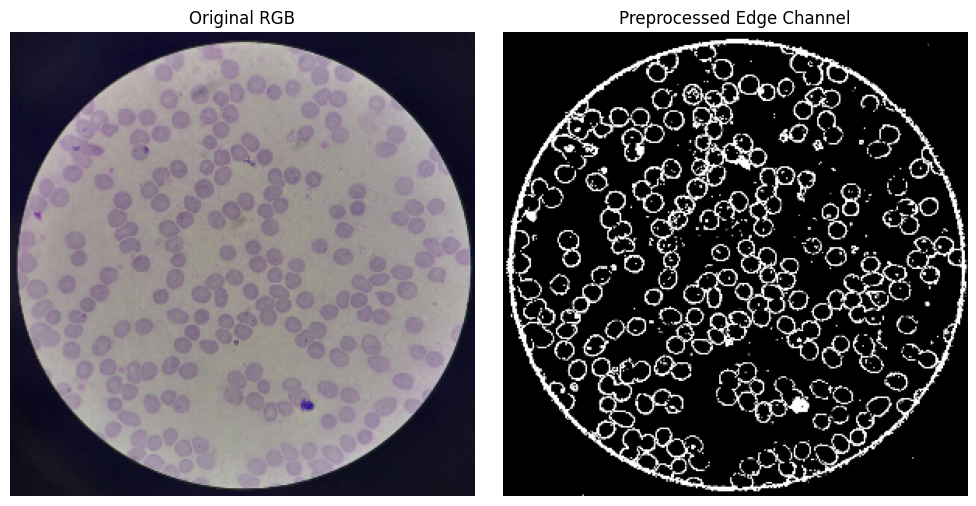

Number of devices: 2
Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 67s 27s/step - accuracy: 0.4883 - auc_1: 0.5205 - loss: 1.1087 - precision_1: 0.5113 - recall_1: 0.5223 - val_accuracy: 0.5333 - val_auc_1: 0.9113 - val_loss: 0.8521 - val_precision_1: 0.5333 - val_recall_1: 1.0000
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 9s/step - accuracy: 0.5254 - auc_1: 0.8308 - loss: 0.8502 - precision_1: 0.5091 - recall_1: 1.0000 - val_accuracy: 0.8000 - val_auc_1: 0.8862 - val_loss: 0.4636 - val_precision_1: 0.7941 - val_recall_1: 0.8438
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 14s/step - accuracy: 0.7832 - auc_1: 0.8913 - loss: 0.4625 - precision_1: 0.8680 - recall_1: 0.6767 - val_accuracy: 0.7667 - val_auc_1: 0.9420 - val_loss: 0.4280 - val_precision_1: 0.9500 - val_recall_1: 0.5938
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 40s 14s/step - accuracy: 0.8789 - auc_1: 0.9506 - loss: 0.3156 - precision_1: 0.9292 - recall_1: 0.8196 - val_accuracy: 0.8833 - val_auc_1: 0.9214 - val_loss: 0.3482 - val_precision_1: 0.9062

In [2]:
import os
import cv2
import numpy as np
import random
import shutil
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import f1_score

# === Paths ===
dataset_path = '/kaggle/input/sickle-cell-disease-dataset'
positive_path = os.path.join(dataset_path, 'Positive/Unlabelled')
negative_path = os.path.join(dataset_path, 'Negative/Clear')
train_dir = '/kaggle/working/train'
validation_dir = '/kaggle/working/validation'

# === Create directories ===
os.makedirs(os.path.join(train_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'negative'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'positive'), exist_ok=True)
os.makedirs(os.path.join(validation_dir, 'negative'), exist_ok=True)

# === Move images (copy instead due to read-only input dir) ===
def split_and_copy(src_dir, dst_train, dst_val):
    images = [f for f in os.listdir(src_dir) if f.endswith('.jpg')]
    random.shuffle(images)
    split_idx = int(0.8 * len(images))
    for i, img in enumerate(images):
        src = os.path.join(src_dir, img)
        dst = os.path.join(dst_train if i < split_idx else dst_val, img)
        shutil.copy(src, dst)

split_and_copy(positive_path, os.path.join(train_dir, 'positive'), os.path.join(validation_dir, 'positive'))
split_and_copy(negative_path, os.path.join(train_dir, 'negative'), os.path.join(validation_dir, 'negative'))

# === Preprocessing: Scharr edges ===
IMG_SIZE = (299, 299)  # InceptionV3 expects 299x299 images

# Utility to load image paths and labels
def load_image_paths(folder, label):
    return [
        (os.path.join(folder, fname), label)
        for fname in os.listdir(folder)
        if fname.lower().endswith('.jpg')
    ]


def preprocess_image(img_path, target_size=(299, 299)):
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Image not found or unreadable: {img_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # === Scharr Edge Detection ===
    def thick_scharr_mask(channel, threshold=100):
        grad_x = cv2.Scharr(channel, cv2.CV_64F, 1, 0)
        grad_y = cv2.Scharr(channel, cv2.CV_64F, 0, 1)
        mag = cv2.magnitude(grad_x, grad_y)
        mag = cv2.convertScaleAbs(mag)
        _, mask = cv2.threshold(mag, threshold, 255, cv2.THRESH_BINARY)
        return mask

    r, g, b = cv2.split(img_rgb)
    r_mask = thick_scharr_mask(r)
    g_mask = thick_scharr_mask(g)
    b_mask = thick_scharr_mask(b)

    combined_mask_or = cv2.bitwise_or(cv2.bitwise_or(r_mask, g_mask), b_mask)

    # Morphological Opening
    kernel = np.ones((3, 3), np.uint8)
    clean_edge_mask_or = cv2.morphologyEx(combined_mask_or, cv2.MORPH_OPEN, kernel, iterations=1)

    # Resize image and mask (if needed)
    img_rgb_resized = cv2.resize(img_rgb, target_size)
    edge_mask_resized = cv2.resize(clean_edge_mask_or, target_size)

    # Normalize edge mask and expand dims
    edge_mask_resized = edge_mask_resized.astype(np.float32) / 255.0
    edge_mask_resized = np.expand_dims(edge_mask_resized, axis=-1)

    # Stack RGB + edge to make 4-channel input
    preprocessed = np.concatenate((img_rgb_resized / 255.0, edge_mask_resized), axis=-1)
    return preprocessed
sample_image_path = os.path.join(train_dir, 'negative','1.jpg')
preprocessed_sample = preprocess_image(sample_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(preprocessed_sample[..., :3])
plt.title("Original RGB")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(preprocessed_sample[..., 3], cmap='gray')
plt.title("Preprocessed Edge Channel")
plt.axis('off')
plt.tight_layout()
plt.show()

# === Data Generator ===
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_dir, batch_size=64):  # Increase batch size for faster processing
        self.image_paths = [
            os.path.join(image_dir, fname)
            for fname in os.listdir(image_dir)
            if fname.lower().endswith('.jpg')
        ]

        self.batch_size = batch_size
        self.labels = [1 if 'positive' in image_dir else 0] * len(self.image_paths)

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, idx):
        batch_paths = self.image_paths[idx * self.batch_size: (idx + 1) * self.batch_size]
        batch_images = np.array([preprocess_image(p) for p in batch_paths])
        batch_labels = np.array(self.labels[idx * self.batch_size: (idx + 1) * self.batch_size])
        return batch_images, batch_labels

# === Generators ===
train_gen_pos = CustomDataGenerator(os.path.join(train_dir, 'positive'))
train_gen_neg = CustomDataGenerator(os.path.join(train_dir, 'negative'))
val_gen_pos = CustomDataGenerator(os.path.join(validation_dir, 'positive'))
val_gen_neg = CustomDataGenerator(os.path.join(validation_dir, 'negative'))

def combine_generators(*gens):
    while True:
        all_batches = [next(iter(g)) for g in gens]
        x = np.concatenate([b[0] for b in all_batches])
        y = np.concatenate([b[1] for b in all_batches])
        idx = np.arange(len(x))
        np.random.shuffle(idx)
        yield x[idx], y[idx]

train_gen = combine_generators(train_gen_pos, train_gen_neg)
val_gen = combine_generators(val_gen_pos, val_gen_neg)

# === Metrics ===
def f1_metric(y_true, y_pred):
    """ Custom F1 score metric """
    y_pred = tf.round(y_pred)  # Round the predicted values to 0 or 1
    return 2 * (tf.keras.metrics.Precision()(y_true, y_pred) * tf.keras.metrics.Recall()(y_true, y_pred)) / (tf.keras.metrics.Precision()(y_true, y_pred) + tf.keras.metrics.Recall()(y_true, y_pred))

# === Model ===
def build_model():
    input_tensor = layers.Input(shape=(299, 299, 4), name="input_4ch")
    
    # Convert 4 channels (RGB + edge) to 3 channels for InceptionV3
    conv_to_rgb = layers.Conv2D(3, (1, 1), activation='linear', name='conv_to_rgb')(input_tensor)

    # Load InceptionV3 model (WITHOUT using input_tensor argument!)
    base = InceptionV3(include_top=False, weights='imagenet', input_shape=(299, 299, 3))
    base.trainable = False

    # Feed our converted RGB tensor into InceptionV3
    x = base(conv_to_rgb)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    output = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs=input_tensor, outputs=output)
    return model

# === Mirrored Strategy ===
strategy = tf.distribute.MirroredStrategy()

print(f"Number of devices: {strategy.num_replicas_in_sync}")

with strategy.scope():
    model2 = build_model()
    model2.compile(
        optimizer=Adam(), 
        loss='binary_crossentropy', 
        metrics=[
            'accuracy', 
            tf.keras.metrics.AUC(),
            tf.keras.metrics.Precision(),
            tf.keras.metrics.Recall()
        ]
    )

# === Train ===
steps_per_epoch = min(len(train_gen_pos), len(train_gen_neg))
validation_steps = min(len(val_gen_pos), len(val_gen_neg))

history = model2.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    epochs=10
)

# === Save model ===
model2.save("/kaggle/working/sickle_cell_inception_model_multi_gpu.h5")


In [ ]:
output_dir = "/kaggle/working/plots/Inception"
os.makedirs(output_dir, exist_ok=True)

# Plot and save accuracy
plt.figure()
plt.plot(history.history['accuracy'])  # Only use 'history' here
plt.plot(history.history['val_accuracy'])  # Only use 'history' here
plt.title("Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "accuracy.png"))
plt.show()

# Plot and save loss
plt.figure()
plt.plot(history.history['loss'])  # Only use 'history' here
plt.plot(history.history['val_loss'])  # Only use 'history' here
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "loss.png"))
plt.show()

# Plot and save loss
plt.figure()
plt.plot(history.history['auc_1'])  # Only use 'history' here
plt.plot(history.history['val_auc_1'])  # Only use 'history' here
plt.title("Model AUC")
plt.ylabel("AUC")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "auc.png"))
plt.show()

# Plot and save loss
plt.figure()
plt.plot(history.history['precision_3'])  # Only use 'history' here
plt.plot(history.history['val_precision_3'])  # Only use 'history' here
plt.title("Model precision")
plt.ylabel("Precision")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "precision.png"))
plt.show()


# Plot and save loss
plt.figure()
plt.plot(history.history['precision_3'])  # Only use 'history' here
plt.plot(history.history['val_precision_3'])  # Only use 'history' here
plt.title("Model precision")
plt.ylabel("Precision")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper left")
plt.savefig(os.path.join(output_dir, "precision.png"))
plt.show()

In [57]:
vgg16_model = model2.get_layer('inception_v3')  # Replace 'vgg16' with the correct name if different
# Iterate through layers inside the vgg16 model and print the layer names
for layer in model2.layers:
    print(layer.name)

input_4ch
conv_to_rgb
inception_v3
global_average_pooling2d_4
dense_8
dropout_4
dense_9


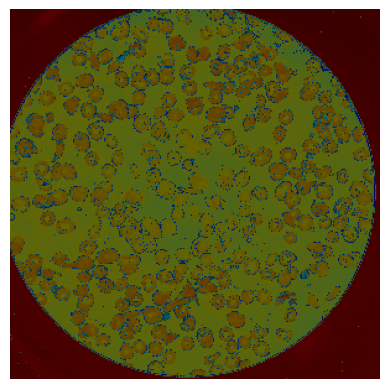

In [66]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    # Create a model that maps the input image to the activations of the last convolutional layer and the model's predictions
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Get the gradient of the class with respect to the output feature map of the last convolutional layer
    with tf.GradientTape() as tape:
        # Watch the input image and get model outputs
        last_conv_layer_output, preds = grad_model(img_array)
        tape.watch(last_conv_layer_output)
        class_channel = preds[:, np.argmax(preds[0])]  # Get the class with the highest probability

    # Calculate the gradient of the class output with respect to the last conv layer feature map
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pool the gradients across all the axes (average over width and height)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel of the feature map by the "importance" of that channel
    last_conv_layer_output = last_conv_layer_output[0].numpy()  # Convert tensor to numpy array
    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i].numpy()  # Convert to numpy and apply scaling

    # Calculate the heatmap by summing over all channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # Normalize the heatmap to the range [0, 1]
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay the heatmap on the image
def overlay_gradcam(heatmap, img_array, alpha=0.4):
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Convert the heatmap to a jet colormap
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Extract only the RGB channels (the first 3 channels)
    img_rgb = img_array[0, :, :, :3]  # Take the first image, and select only the first 3 channels (RGB)

    # Superimpose the heatmap on the RGB image
    superimposed_img = heatmap * alpha + img_rgb  # Add heatmap to RGB channels
    superimposed_img = np.uint8(np.clip(superimposed_img, 0, 255))  # Ensure values are in the [0, 255] range

    return superimposed_img


# Dynamically find the last convolutional layer in model2
last_conv_layer_name = None
for layer in model2.layers:
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name = layer.name

# Load and preprocess the image (using your 4-channel preprocessing function)
img_path = '/kaggle/working/train/positive/10.jpg'  # Update with your image path
img_array = preprocess_image(img_path, target_size=(299, 299))

# Expand dims to match the batch size (1, 299, 299, 4)
img_array = np.expand_dims(img_array, axis=0)

# Apply Grad-CAM on model2
heatmap = make_gradcam_heatmap(img_array, model2, last_conv_layer_name)

# Overlay Grad-CAM heatmap on the original image
superimposed_img = overlay_gradcam(heatmap, img_array)

# Display the superimposed image
plt.imshow(superimposed_img)
plt.axis('off')  # Hide axis
plt.show()


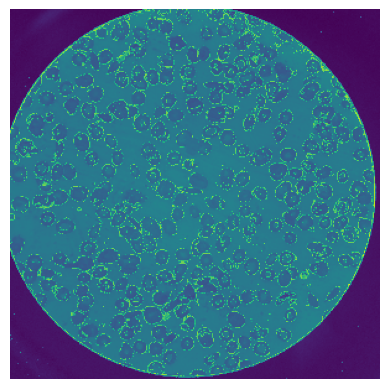

In [68]:
plt.imshow(heatmap)
plt.axis('off')  # Hide axis
plt.show()

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    # Create a model that maps the input image to the activations of the last convolutional layer and the model's predictions
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Get the gradient of the class with respect to the output feature map of the last convolutional layer
    with tf.GradientTape() as tape:
        # Watch the input image and get model outputs
        last_conv_layer_output, preds = grad_model(img_array)
        tape.watch(last_conv_layer_output)
        class_channel = preds[:, np.argmax(preds[0])]  # Get the class with the highest probability

    # Calculate the gradient of the class output with respect to the last conv layer feature map
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pool the gradients across all the axes (average over width and height)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel of the feature map by the "importance" of that channel
    last_conv_layer_output = last_conv_layer_output[0].numpy()  # Convert tensor to numpy array
    for i in range(last_conv_layer_output.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i].numpy()  # Convert to numpy and apply scaling

    # Calculate the heatmap by summing over all channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # Normalize the heatmap to the range [0, 1]
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

# Function to overlay the heatmap on the image
def overlay_gradcam(heatmap, img_array, alpha=0.4):
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))

    # Convert the heatmap to a jet colormap
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Extract only the RGB channels (the first 3 channels)
    img_rgb = img_array[0, :, :, :3]  # Take the first image, and select only the first 3 channels (RGB)

    # Superimpose the heatmap on the RGB image
    superimposed_img = heatmap * alpha + img_rgb  # Add heatmap to RGB channels
    superimposed_img = np.uint8(np.clip(superimposed_img, 0, 255))  # Ensure values are in the [0, 255] range

    return superimposed_img


# Load the custom model (model3) trained on VGG16 structure
model3 = tf.keras.models.load_model('/kaggle/working/sickle_cell_vgg_model.h5')

# Dynamically find the last convolutional layer's name (VGG16-like model)
last_conv_layer_name = 'block5_conv3'  # Same as VGG16's last conv layer

# Image path (update with your image path)
img_path = '/kaggle/working/train/positive/10.jpg'

# Preprocess image using your 4-channel edge preprocessing function
img_array = preprocess_image(img_path, target_size=(224, 224))  # Use your custom 4-channel preprocessing

# Expand dims to match the batch size (1, 224, 224, 4)
img_array = np.expand_dims(img_array, axis=0)

# Apply Grad-CAM on model3
heatmap = make_gradcam_heatmap(img_array, model3, last_conv_layer_name)

# Overlay Grad-CAM heatmap on the original image
superimposed_img = overlay_gradcam(heatmap, img_array)

# Display the superimposed image
plt.imshow(superimposed_img)
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(heatmap)
plt.axis('off')  # Hide axis
plt.show()


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/kaggle/working/sickle_cell_vgg_model.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [3]:
!ls /kaggle/working